# **STEP 1: MOUNT GOOGLE DRIVE**

In [21]:
from google.colab import drive
import shutil
import os

mountpoint = "/content/drive"

# 🔹 Step 1: Unmount if mounted
if os.path.ismount(mountpoint):
    print("🔄 Unmounting Google Drive...")
    !fusermount -u /content/drive

# 🔹 Step 2: Remove leftover folder completely
if os.path.exists(mountpoint):
    print("🧹 Cleaning up leftover mountpoint...")
    shutil.rmtree(mountpoint, ignore_errors=True)

# 🔹 Step 3: Fresh mount
print("📂 Mounting Google Drive...")
drive.mount(mountpoint, force_remount=True)
print("✅ Google Drive mounted successfully!")


🔄 Unmounting Google Drive...
🧹 Cleaning up leftover mountpoint...
📂 Mounting Google Drive...
Mounted at /content/drive
✅ Google Drive mounted successfully!


# **STEP 2: EDA ANALYSIS**

## **i) Total Files**

In [ ]:
import os

base_path = "/content/drive/MyDrive/AI Trace Finder"
print("Contents of dataset root:", os.listdir(base_path))


Contents of dataset root: ['Wikipedia', 'Tampered images', 'Official', 'Originals', 'Flatfield', 'official_wiki_preprocess.pkl', 'flatfield_preprocess.pkl', 'scannerfingerprints.pkl', 'fp_keys.npy', 'metrics', 'features.pkl', 'dataset.csv', 'advanced_features.pkl', 'pca_visualization.png', 'tsne_visualization.png', 'feature_heatmap.png']


In [ ]:
import os
from google.colab import drive

# Mount Google Drive (if not already mounted)
drive.mount('/content/drive', force_remount=False)

main_counts = {}  # dictionary to store counts per main folder

def print_tree_counts(path, indent="", top_level=None):
    global main_counts
    items = sorted(os.listdir(path))
    file_count = sum([1 for i in items if os.path.isfile(os.path.join(path, i))])
    print(f"{indent}📁 {os.path.basename(path)}/ ({file_count} files)")

    # track counts for top-level main folders
    if top_level is not None:
        main_counts[top_level] = main_counts.get(top_level, 0) + file_count

    for item in items:
        item_path = os.path.join(path, item)
        if os.path.isdir(item_path):
            # pass top_level = current main folder
            if indent == "":  # first level (Flatfield, Official, etc.)
                print_tree_counts(item_path, indent + "    ", top_level=item)
            else:
                print_tree_counts(item_path, indent + "    ", top_level=top_level)

# ---- Run on your dataset ----
dataset_path = "/content/drive/MyDrive/AI Trace Finder"
print_tree_counts(dataset_path)

# ---- Print main folder totals ----
print("\n📊 Total files per main folder:")
for folder, count in main_counts.items():
    print(f"   {folder}: {count} files")

print(f"\n✅ Grand Total: {sum(main_counts.values())} files")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
📁 AI Trace Finder/ (1 files)
    📁 Flatfield/ (0 files)
        📁 Canon120-1/ (2 files)
        📁 Canon120-2/ (2 files)
        📁 Canon220/ (2 files)
        📁 Canon9000-1/ (2 files)
        📁 Canon9000-2/ (2 files)
        📁 EpsonV370-1/ (2 files)
        📁 EpsonV370-2/ (2 files)
        📁 EpsonV39-1/ (3 files)
        📁 EpsonV39-2/ (2 files)
        📁 EpsonV550/ (2 files)
        📁 HP/ (2 files)
    📁 Official/ (0 files)
        📁 Canon120-1/ (0 files)
            📁 150/ (100 files)
            📁 300/ (100 files)
        📁 Canon120-2/ (0 files)
            📁 150/ (100 files)
            📁 300/ (100 files)
        📁 Canon220/ (0 files)
            📁 150/ (100 files)
            📁 300/ (100 files)
        📁 Canon9000-1/ (0 files)
            📁 150/ (100 files)
            📁 300/ (100 files)
        📁 Canon9000-2/ (0 files)
            📁 150/ (100 files)
     

✅ Total images scanned: 4590

--- Image Count per Folder ---
folder
Wikipedia    2368
Official     2200
Flatfield      22
Name: count, dtype: int64

--- Image Modes ---
mode
RGB    4590
Name: count, dtype: int64

--- Image Sizes ---
             width       height
count  4590.000000  4590.000000
mean   1857.921786  2626.513725
std     620.431195   876.967258
min    1236.000000  1727.000000
25%    1240.000000  1754.000000
50%    1240.000000  1754.000000
75%    2480.000000  3508.000000
max    2481.000000  3508.000000


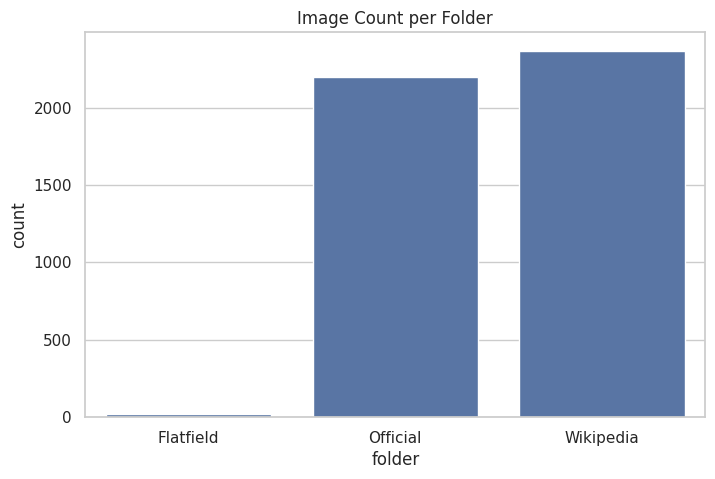

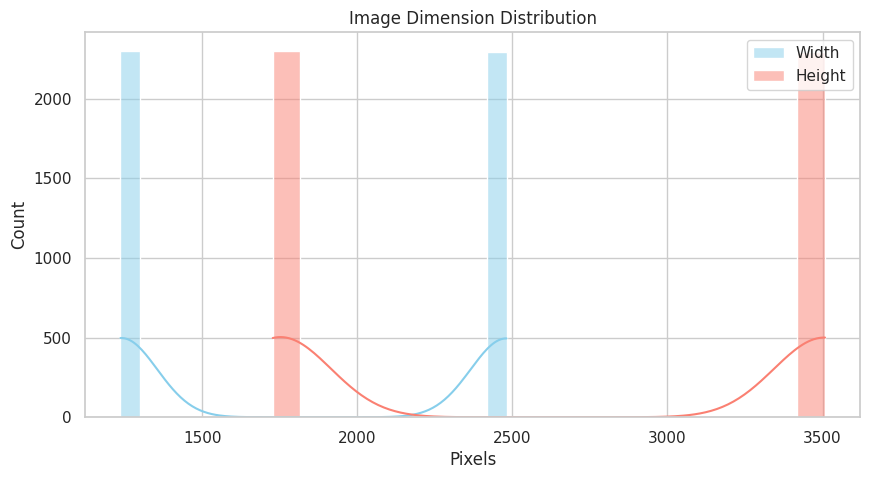

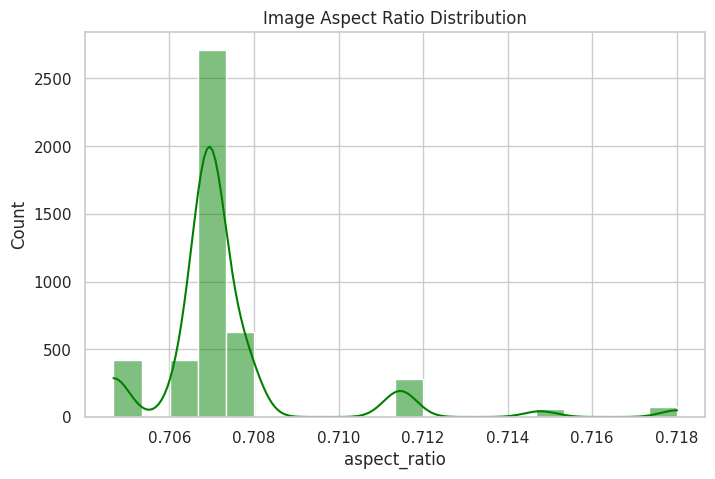


Sample from Flatfield: 300.tif


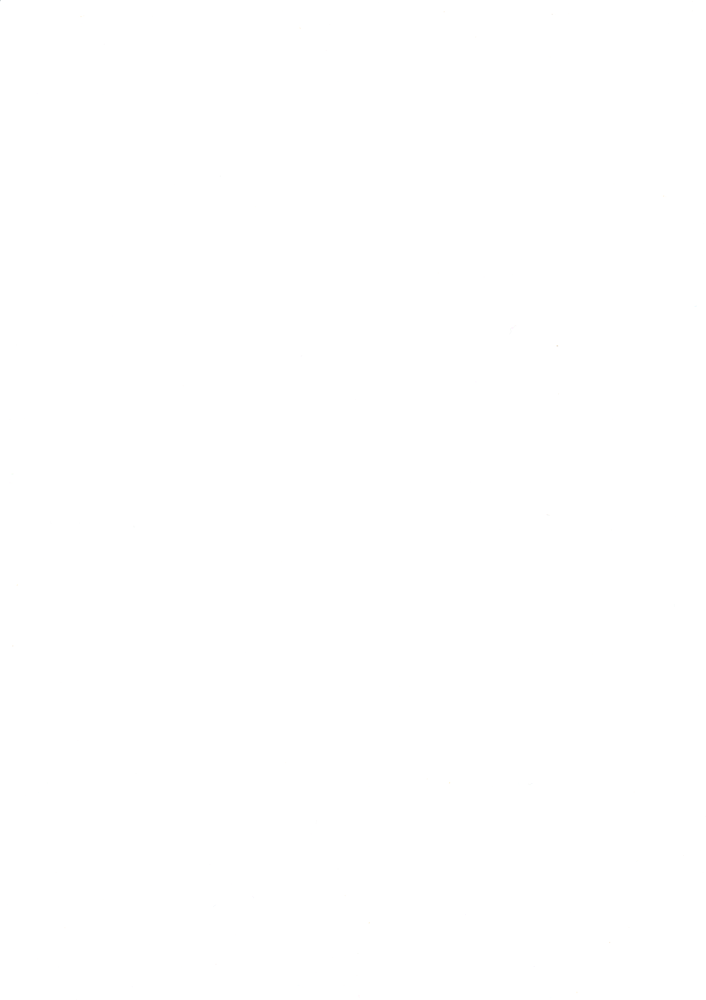


Sample from Official: s9_66.tif


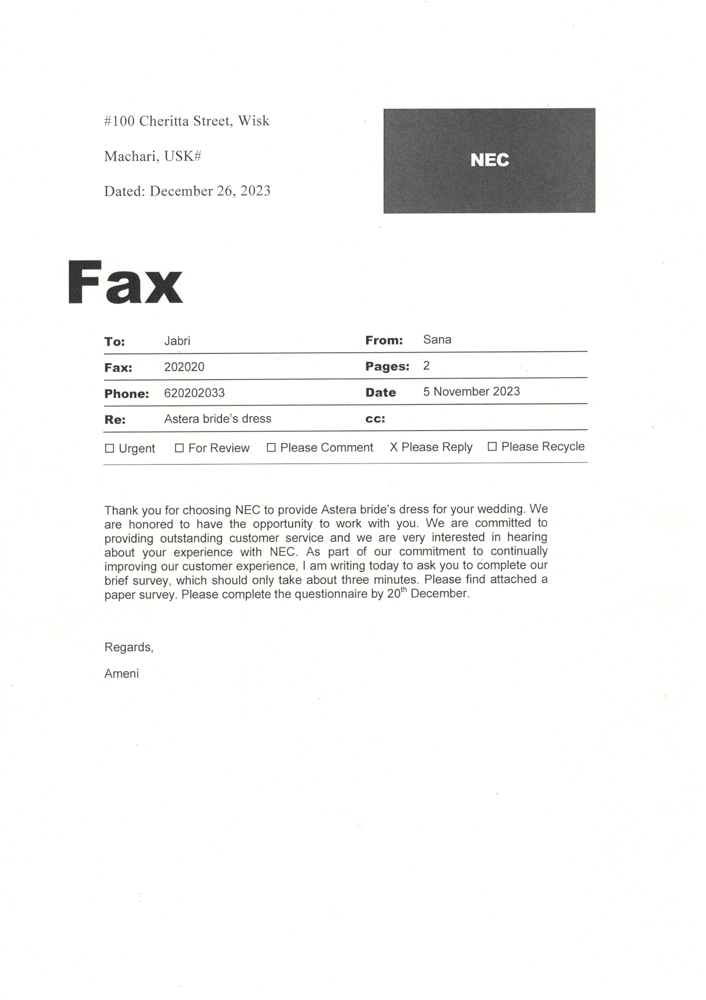


Sample from Wikipedia: s5_28.tif


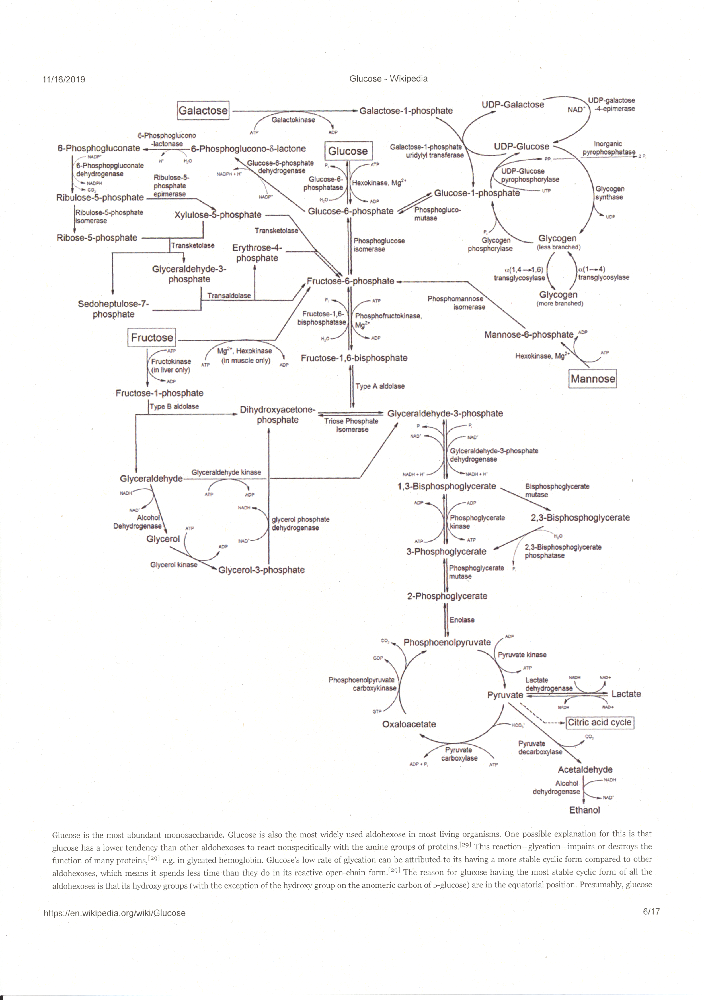

In [ ]:
import os
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------
# Paths to Dataset Folders
# -----------------------------
base_path = "/content/drive/MyDrive/AI Trace Finder"
folders = {
    "Flatfield": os.path.join(base_path, "Flatfield"),
    "Official": os.path.join(base_path, "Official"),
    "Wikipedia": os.path.join(base_path, "Wikipedia")
}

# -----------------------------
# Function to scan images
# -----------------------------
image_data = []

def scan_images(path, folder_name):
    if not os.path.exists(path):
        print(f"⚠️ Path does not exist: {path}")
        return
    for root, dirs, files in os.walk(path):
        for file in files:
            # Skip hidden/system files
            if file.startswith("._") or file.startswith("."):
                continue
            if file.lower().endswith((".tif", ".png", ".jpg", ".jpeg")):
                file_path = os.path.join(root, file)
                try:
                    img = Image.open(file_path)
                    image_data.append({
                        "file_path": file_path,
                        "folder": folder_name,
                        "root": root,
                        "filename": file,
                        "width": img.width,
                        "height": img.height,
                        "mode": img.mode
                    })
                except Exception as e:
                    print(f"⚠️ Skipping {file_path}: {e}")

# -----------------------------
# Scan all folders
# -----------------------------
for name, path in folders.items():
    scan_images(path, name)

# -----------------------------
# Convert to DataFrame
# -----------------------------
df = pd.DataFrame(image_data)
print("✅ Total images scanned:", len(df))
df.head()

# -----------------------------
# Basic Statistics
# -----------------------------
print("\n--- Image Count per Folder ---")
print(df['folder'].value_counts())

print("\n--- Image Modes ---")
print(df['mode'].value_counts())

print("\n--- Image Sizes ---")
print(df[['width', 'height']].describe())

# -----------------------------
# Visualizations
# -----------------------------
sns.set(style="whitegrid")

# Count of images per folder
plt.figure(figsize=(8,5))
sns.countplot(data=df, x='folder')
plt.title("Image Count per Folder")
plt.show()

# Image size distribution
plt.figure(figsize=(10,5))
sns.histplot(df['width'], bins=20, color='skyblue', label='Width', kde=True)
sns.histplot(df['height'], bins=20, color='salmon', label='Height', kde=True)
plt.title("Image Dimension Distribution")
plt.xlabel("Pixels")
plt.legend()
plt.show()

# Aspect ratio distribution
df['aspect_ratio'] = df['width'] / df['height']
plt.figure(figsize=(8,5))
sns.histplot(df['aspect_ratio'], bins=20, kde=True, color='green')
plt.title("Image Aspect Ratio Distribution")
plt.show()

# Optional: Sample images from each folder
import random
from IPython.display import display

for folder_name in df['folder'].unique():
    sample_row = df[df['folder']==folder_name].sample(1).iloc[0]
    img = Image.open(sample_row['file_path'])
    print(f"\nSample from {folder_name}: {sample_row['filename']}")
    display(img)


# **Preprocessing**

## **i) Preprocess on Flatfield images**

In [ ]:
import cv2
import pywt
import numpy as np

def preprocess_residual_pywt(img, wavelet='db2', level=4):
    """
    Extracts residual (noise) using wavelet denoising.
    img: grayscale numpy array
    """
    img = img.astype(np.float32) / 255.0
    coeffs = pywt.wavedec2(img, wavelet, level=level)

    # Suppress detail coefficients to remove image content
    coeffs_H = [tuple([pywt.threshold(c, np.std(c)/2, mode='soft') for c in detail])
                for detail in coeffs[1:]]
    coeffs = (coeffs[0], *coeffs_H)

    # Reconstruct denoised image
    denoised = pywt.waverec2(coeffs, wavelet)
    denoised = cv2.resize(denoised, img.shape[::-1])

    # Residual = original - denoised
    residual = img - denoised
    return residual


In [ ]:
from skimage.feature import local_binary_pattern

def corr2d(a, b):
    a = a.flatten() - np.mean(a)
    b = b.flatten() - np.mean(b)
    denom = np.linalg.norm(a) * np.linalg.norm(b)
    return float(np.dot(a, b) / denom) if denom != 0 else 0.0

def fft_radial_energy(img, K=6):
    f = np.fft.fftshift(np.fft.fft2(img))
    psd = np.abs(f) ** 2
    center = np.array(psd.shape) // 2
    Y, X = np.ogrid[:psd.shape[0], :psd.shape[1]]
    r = np.sqrt((X-center[1])**2 + (Y-center[0])**2)
    r = r.astype(int)
    radial_energy = [psd[r==k].mean() if np.any(r==k) else 0 for k in range(1,K+1)]
    return radial_energy

def lbp_hist_safe(img, P=8, R=1.0, n_bins=10):
    lbp = local_binary_pattern(img, P, R, method='uniform')
    hist, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins))
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-6)
    return hist.tolist()

def make_feats_from_res(residual, scanner_fps, fp_keys):
    """
    Build hybrid feature vector: [PRNU_corr + FFT_energy + LBP_hist]
    """
    v_corr = [corr2d(residual, scanner_fps[k]) for k in fp_keys]   # PRNU correlations
    v_fft  = fft_radial_energy(residual, K=6)                      # FFT energy
    v_lbp  = lbp_hist_safe(residual, P=8, R=1.0, n_bins=10)        # LBP histogram
    return np.array(v_corr + v_fft + v_lbp, dtype=np.float32)


In [ ]:



from google.colab import drive
drive.mount('/content/drive', force_remount=False)

import os, pickle, cv2, numpy as np
from tqdm import tqdm

# ---------------------------
# 1) Auto-locate Flatfield folder
# ---------------------------
def find_flatfield(base="/content/drive/MyDrive/AI Trace Finder"):
    found = []
    for root, dirs, files in os.walk(base):
        for d in dirs:
            if d.lower() == "flatfield":   # case-insensitive search
                found.append(os.path.join(root, d))
    return found

flatfield_paths = find_flatfield("/content/drive/MyDrive/AI Trace Finder")
if not flatfield_paths:
    raise FileNotFoundError("❌ No 'Flatfield' folder found in your Drive. Please check dataset upload.")
else:
    FLATFIELD_DIR = flatfield_paths[0]  # take the first match
    BASE = os.path.dirname(FLATFIELD_DIR)
    OUTPUT_PKL = os.path.join(BASE, "flatfield_preprocess.pkl")
    print("✅ Found Flatfield folder:", FLATFIELD_DIR)
    print("Will save residuals to:", OUTPUT_PKL)

# ---------------------------
# 2) Import denoising filters
# ---------------------------
try:
    from skimage.restoration import denoise_wavelet
except Exception:
    !pip install scikit-image
    from skimage.restoration import denoise_wavelet

from scipy.signal import wiener as scipy_wiener

# ---------------------------
# 3) Parameters
# ---------------------------
IMG_SIZE = (256, 256)      # resize target
DENOISE_METHOD = "wavelet"  # "wiener" or "wavelet"

# ---------------------------
# 4) Preprocess function
# ---------------------------
def preprocess_image_residual(path, img_size=IMG_SIZE, method="wiener"):
    """Read image -> grayscale -> resize -> normalize -> denoise -> return residual."""
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    if img is None:
        return None
    if img.ndim == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, img_size, interpolation=cv2.INTER_AREA)
    img = img.astype(np.float32) / 255.0
    if method == "wiener":
        den = scipy_wiener(img, mysize=(5,5))
    else:
        den = denoise_wavelet(img, channel_axis=None, rescale_sigma=True)
    return (img - den).astype(np.float32)

# ---------------------------
# 5) Process all Flatfield images
# ---------------------------
flatfield_residuals = {}
scanners = sorted(os.listdir(FLATFIELD_DIR))

for scanner in tqdm(scanners, desc="Scanners"):
    scanner_dir = os.path.join(FLATFIELD_DIR, scanner)
    if not os.path.isdir(scanner_dir):
        continue

    residuals = []
    for fname in sorted(os.listdir(scanner_dir)):
        if fname.startswith("._"):
            continue
        if not fname.lower().endswith((".tif", ".tiff", ".png", ".jpg", ".jpeg")):
            continue
        fpath = os.path.join(scanner_dir, fname)
        try:
            res = preprocess_image_residual(fpath, IMG_SIZE, DENOISE_METHOD)
            if res is not None:
                residuals.append(res)
        except Exception as e:
            print(f"⚠️ Failed on {fpath}: {e}")

    if residuals:
        flatfield_residuals[scanner] = residuals
    else:
        print(f"⚠️ No valid images for scanner: {scanner}")

# ---------------------------
# 6) Save results
# ---------------------------
with open(OUTPUT_PKL, "wb") as f:
    pickle.dump(flatfield_residuals, f)

# ---------------------------
# 7) Summary
# ---------------------------
total_scanners = len(flatfield_residuals)
total_images = sum(len(v) for v in flatfield_residuals.values())
print(f"\n✅ Done. Saved residuals for {total_scanners} scanners, {total_images} images.")
print("Example scanners:", list(flatfield_residuals.keys())[:5])


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Found Flatfield folder: /content/drive/MyDrive/AI Trace Finder/Flatfield
Will save residuals to: /content/drive/MyDrive/AI Trace Finder/flatfield_preprocess.pkl


Scanners: 100%|██████████| 11/11 [00:53<00:00,  4.88s/it]


✅ Done. Saved residuals for 11 scanners, 22 images.
Example scanners: ['Canon120-1', 'Canon120-2', 'Canon220', 'Canon9000-1', 'Canon9000-2']


## **ii) Preprocess on Official And Wikipedia images**

In [ ]:

import os, cv2, numpy as np, pickle
from tqdm import tqdm
import pywt
from concurrent.futures import ThreadPoolExecutor, as_completed

# Paths
OFFICIAL_DIR = "/content/drive/MyDrive/AI Trace Finder/Official"
WIKI_DIR = "/content/drive/MyDrive/AI Trace Finder/Wikipedia"
OUT_PATH = "/content/drive/MyDrive/AI Trace Finder/official_wiki_preprocess.pkl"

# ---------------------------
# Preprocessing helpers
# ---------------------------
def to_gray(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if img.ndim == 3 else img

def resize_to(img, size=(256,256)):
    return cv2.resize(img, size, interpolation=cv2.INTER_AREA)

def normalize_img(img):
    return img.astype(np.float32) / 255.0

def denoise_wavelet(img):
    coeffs = pywt.dwt2(img, 'haar')
    cA, (cH, cV, cD) = coeffs
    # Zero out detail coefficients for denoising
    cH[:] = 0; cV[:] = 0; cD[:] = 0
    return pywt.idwt2((cA,(cH,cV,cD)), 'haar')

def compute_residual(img):
    denoised = denoise_wavelet(img)
    return img - denoised

def process_single_image(fpath):
    """Preprocess one image and return residual"""
    img = cv2.imread(fpath, cv2.IMREAD_COLOR)
    if img is None:
        return None
    gray = to_gray(img)
    gray = resize_to(gray, (256,256))
    gray = normalize_img(gray)
    return compute_residual(gray)

# ---------------------------
# Dataset Processing
# ---------------------------
def process_dataset(base_dir, dataset_name, residuals_dict):
    print(f"🔄 Preprocessing {dataset_name} images...")

    for scanner in tqdm(os.listdir(base_dir)):
        scanner_path = os.path.join(base_dir, scanner)
        if not os.path.isdir(scanner_path):
            continue

        residuals_dict[dataset_name][scanner] = {}

        for dpi in os.listdir(scanner_path):   # 150, 300
            dpi_path = os.path.join(scanner_path, dpi)
            if not os.path.isdir(dpi_path):
                continue

            files = [os.path.join(dpi_path, f) for f in os.listdir(dpi_path)
                     if f.lower().endswith(('.tif','.tiff','.jpg','.jpeg','.png'))]

            dpi_residuals = []
            # Parallel processing
            with ThreadPoolExecutor(max_workers=8) as executor:  # adjust workers based on Colab
                futures = [executor.submit(process_single_image, f) for f in files]
                for fut in as_completed(futures):
                    res = fut.result()
                    if res is not None:
                        dpi_residuals.append(res)

            residuals_dict[dataset_name][scanner][dpi] = dpi_residuals

# ---------------------------
# Main Execution
# ---------------------------
residuals_dict = {"Official": {}, "Wikipedia": {}}

process_dataset(OFFICIAL_DIR, "Official", residuals_dict)
process_dataset(WIKI_DIR, "Wikipedia", residuals_dict)

with open(OUT_PATH, "wb") as f:
    pickle.dump(residuals_dict, f)

print(f"✅ Saved Official+Wiki residuals to {OUT_PATH}")


🔄 Preprocessing Official images...


100%|██████████| 11/11 [17:31<00:00, 95.59s/it]


🔄 Preprocessing Wikipedia images...


100%|██████████| 11/11 [19:38<00:00, 107.09s/it]


✅ Saved Official+Wiki residuals to /content/drive/MyDrive/AI Trace Finder/official_wiki_preprocess.pkl


## **Store Wikipedia and Official data as a Dataset**

In [ ]:

import os, csv

roots = [
  ("/content/drive/MyDrive/AI Trace Finder/Official", "Official"),
  ("/content/drive/MyDrive/AI Trace Finder/Wikipedia", "Wikipedia"),
]
rows = []
for root, ds in roots:
    if not os.path.isdir(root):
        continue
    for scanner in sorted(os.listdir(root)):
        sp = os.path.join(root, scanner)
        if not os.path.isdir(sp):
            continue
        for dpi in sorted(os.listdir(sp)):
            dp = os.path.join(sp, dpi)
            if not os.path.isdir(dp):
                continue
            for f in sorted(os.listdir(dp)):
                if f.lower().endswith(('.tif','.tiff','.png','.jpg','.jpeg')):
                    rows.append([ds, scanner, dpi, os.path.join(dp,f)])

out_csv = "/content/drive/MyDrive/AI Trace Finder/dataset.csv"
os.makedirs(os.path.dirname(out_csv), exist_ok=True)
with open(out_csv, "w", newline="") as fh:
    w = csv.writer(fh)
    w.writerow(["dataset","scanner","dpi","path"])
    w.writerows(rows)

print("Wrote inventory:", out_csv, "| rows:", len(rows))


Wrote inventory: /content/drive/MyDrive/AI Trace Finder/dataset.csv | rows: 4568


## **Visualize few sample Flatfield preprocessed images**

✅ Loaded Flatfield scanners: ['Canon120-1', 'Canon120-2', 'Canon220', 'Canon9000-1', 'Canon9000-2', 'EpsonV370-1', 'EpsonV370-2', 'EpsonV39-1', 'EpsonV39-2', 'EpsonV550', 'HP']


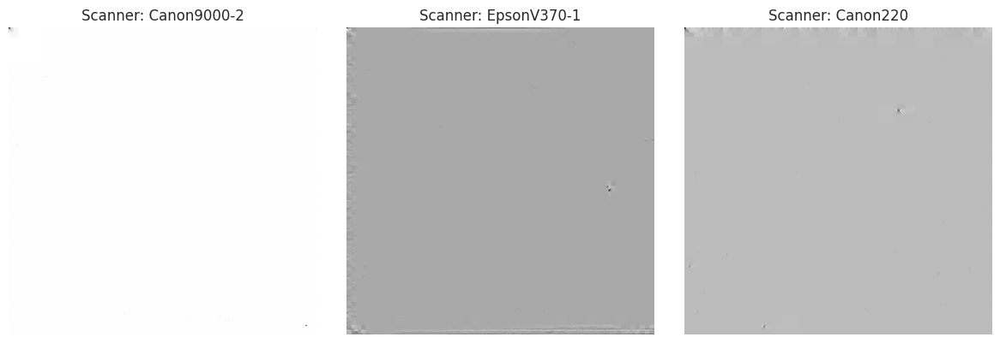

In [ ]:
import pickle
import random
import matplotlib.pyplot as plt

# -------------------------------
# PARAMETERS
# -------------------------------
PICKLE_PATH = "/content/drive/MyDrive/AI Trace Finder/flatfield_preprocess.pkl"
N_SAMPLES = 3  # Number of images to visualize

# -------------------------------
# LOAD DATA
# -------------------------------
with open(PICKLE_PATH, "rb") as f:
    data = pickle.load(f)

print("✅ Loaded Flatfield scanners:", list(data.keys()))

# -------------------------------
# SAMPLE RESIDUALS
# -------------------------------
def sample_residuals(scanner_dict, n_samples):
    """Randomly sample residual images per scanner"""
    samples = []
    scanners = list(scanner_dict.keys())
    random.shuffle(scanners)

    # Pick one image from up to n_samples scanners
    for scanner in scanners[:n_samples]:
        images = scanner_dict[scanner]
        if len(images) > 0:
            img = random.choice(images)
            samples.append((scanner, img))
    return samples

all_samples = sample_residuals(data, N_SAMPLES)

# -------------------------------
# VISUALIZATION
# -------------------------------
cols = len(all_samples)
rows = 1

plt.figure(figsize=(4 * cols, 4))
for idx, (scanner, img) in enumerate(all_samples):
    plt.subplot(rows, cols, idx + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f"Scanner: {scanner}")
    plt.axis('off')

plt.tight_layout()
plt.show()


## **Fingerprint Extraction from Flatfields**

In [ ]:

import pickle, numpy as np

# Paths
FLATFIELD_RESIDUALS_PATH = "/content/drive/MyDrive/AI Trace Finder/flatfield_preprocess.pkl"  # from Step 2A
FP_OUT_PATH = "/content/drive/MyDrive/AI Trace Finder/scannerfingerprints.pkl"
ORDER_NPY   = "/content/drive/MyDrive/AI Trace Finder/fp_keys.npy"

# ---------------------------
# Load residuals
# ---------------------------
with open(FLATFIELD_RESIDUALS_PATH, "rb") as f:
    flatfield_residuals = pickle.load(f)

# ---------------------------
# Compute fingerprint per scanner
# ---------------------------
scanner_fingerprints = {}
print("🔄 Computing fingerprints from Flatfields...")
for scanner, residuals in flatfield_residuals.items():
    if not residuals:
        continue
    stack = np.stack(residuals, axis=0)       # (num_images, H, W)
    fingerprint = np.mean(stack, axis=0)      # average residual
    scanner_fingerprints[scanner] = fingerprint

print(f"✅ Extracted {len(scanner_fingerprints)} scanner fingerprints.")

# ---------------------------
# Save fingerprints
# ---------------------------
with open(FP_OUT_PATH, "wb") as f:
    pickle.dump(scanner_fingerprints, f)
print(f"✅ Saved scanner fingerprints to {FP_OUT_PATH}")

# ---------------------------
# Save a stable, deterministic order for scanners
# ---------------------------
fp_keys = sorted(scanner_fingerprints.keys())
np.save(ORDER_NPY, np.array(fp_keys))
print("✅ Saved fp_keys.npy with order:", fp_keys)


🔄 Computing fingerprints from Flatfields...
✅ Extracted 11 scanner fingerprints.
✅ Saved scanner fingerprints to /content/drive/MyDrive/AI Trace Finder/scannerfingerprints.pkl
✅ Saved fp_keys.npy with order: ['Canon120-1', 'Canon120-2', 'Canon220', 'Canon9000-1', 'Canon9000-2', 'EpsonV370-1', 'EpsonV370-2', 'EpsonV39-1', 'EpsonV39-2', 'EpsonV550', 'HP']


# **Visualize Fingerprints of FlatField Images**

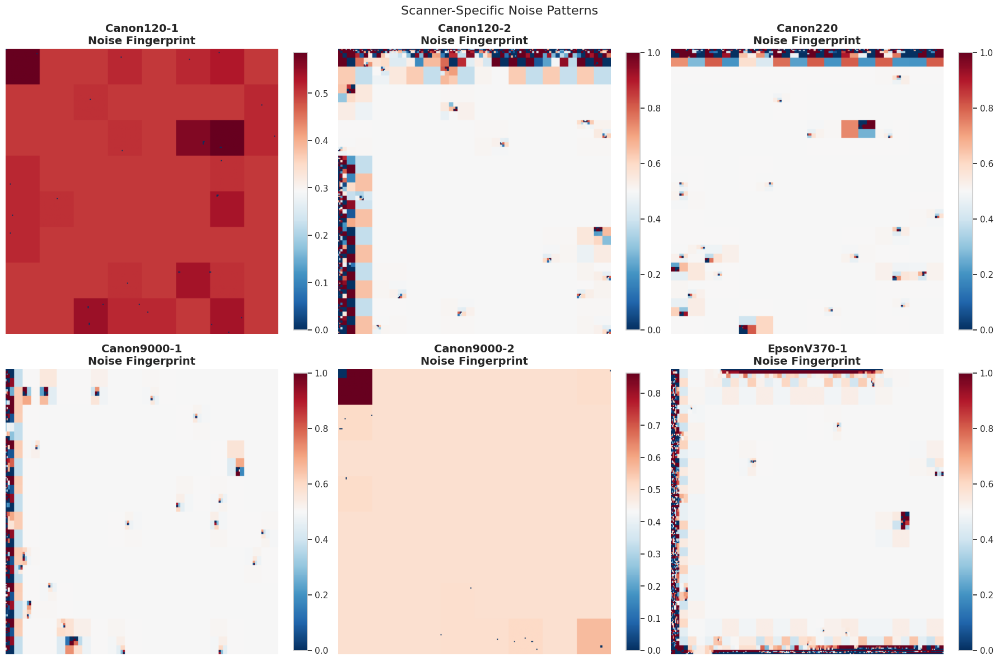

✅ Scanner noise visualization complete


In [ ]:

import matplotlib.pyplot as plt
import numpy as np
import pickle  # FIX: Add missing import
import os

def visualize_scanner_differences():
    """Visualize differences between scanner outputs (noise maps) - REQUIRED by Week 3"""

    with open("/content/drive/MyDrive/AI Trace Finder/scannerfingerprints.pkl", "rb") as f:
        scanner_fps = pickle.load(f)

    # Create noise pattern visualization
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    scanners = list(scanner_fps.keys())[:6]

    for i, scanner in enumerate(scanners):
        fp = scanner_fps[scanner]

        # Enhance contrast for visualization
        fp_enhanced = (fp - fp.mean()) / (fp.std() + 1e-8) * 0.5 + 0.5
        fp_clipped = np.clip(fp_enhanced, 0, 1)

        im = axes[i].imshow(fp_clipped, cmap='RdBu_r', aspect='auto')
        axes[i].set_title(f'{scanner}\nNoise Fingerprint', fontsize=14, fontweight='bold')
        axes[i].axis('off')
        plt.colorbar(im, ax=axes[i], fraction=0.046)

    plt.suptitle('Scanner-Specific Noise Patterns', fontsize=16)
    plt.tight_layout()

    # Save plot
    os.makedirs('/content/drive/MyDrive/AI Trace Finder/metrics', exist_ok=True)
    plt.savefig('/content/drive/MyDrive/AI Trace Finder/metrics/scanner_noise_maps.png',
                dpi=300, bbox_inches='tight')
    plt.show()

    print("✅ Scanner noise visualization complete")

# Run visualization
visualize_scanner_differences()


## **FFT Of FlatField Images**

✅ Loaded Flatfield scanners: ['Canon120-1', 'Canon120-2', 'Canon220', 'Canon9000-1', 'Canon9000-2', 'EpsonV370-1', 'EpsonV370-2', 'EpsonV39-1', 'EpsonV39-2', 'EpsonV550', 'HP']


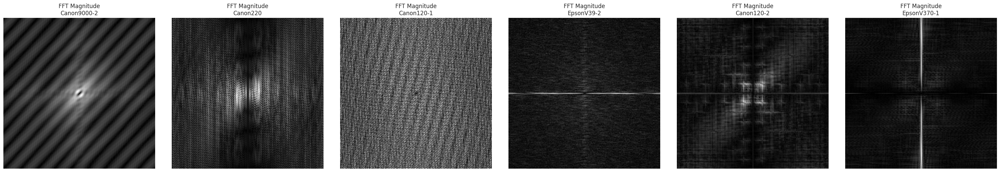

In [ ]:
import pickle
import random
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------
# PARAMETERS
# -------------------------------
PICKLE_PATH = "/content/drive/MyDrive/AI Trace Finder/flatfield_preprocess.pkl"
N_SAMPLES = 6  # Number of scanners to visualize

# -------------------------------
# LOAD DATA
# -------------------------------
with open(PICKLE_PATH, "rb") as f:
    data = pickle.load(f)

print("✅ Loaded Flatfield scanners:", list(data.keys()))

# -------------------------------
# SAMPLE SCANNERS
# -------------------------------
scanners = list(data.keys())
random.shuffle(scanners)
sampled_scanners = scanners[:N_SAMPLES]

# -------------------------------
# VISUALIZATION
# -------------------------------
plt.figure(figsize=(5 * N_SAMPLES, 5))

for idx, scanner in enumerate(sampled_scanners):
    images = data[scanner]
    if len(images) == 0:
        continue

    # Pick a random residual from the scanner
    img = random.choice(images)

    # Compute FFT and shift zero frequency to center
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.log1p(np.abs(fshift))

    # Plot
    plt.subplot(1, N_SAMPLES, idx + 1)
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title(f"FFT Magnitude\n{scanner}")
    plt.axis('off')

plt.tight_layout()
plt.show()


## **Feature Extraction**

In [ ]:

import pickle, numpy as np
from tqdm import tqdm

# Paths
RES_PATH   = "/content/drive/MyDrive/AI Trace Finder/official_wiki_preprocess.pkl"
FP_PATH    = "/content/drive/MyDrive/AI Trace Finder/scannerfingerprints.pkl"
ORDER_NPY  = "/content/drive/MyDrive/AI Trace Finder/fp_keys.npy"
OUT_PATH   = "/content/drive/MyDrive/AI Trace Finder/features.pkl"

# Load fingerprints and fixed order
with open(FP_PATH, "rb") as f:
    scanner_fps = pickle.load(f)
fp_keys = np.load(ORDER_NPY, allow_pickle=True).tolist()
print("✅ Loaded fingerprints and key order. Keys:", fp_keys)

# Helper: normalized cross-correlation (zero-mean cosine similarity)
def corr2d(a, b):
    a = a.astype(np.float32).ravel()
    b = b.astype(np.float32).ravel()
    a -= a.mean()
    b -= b.mean()
    denom = (np.linalg.norm(a) * np.linalg.norm(b))
    return float((a @ b) / denom) if denom != 0 else 0.0
# ZNCC equals the dot product of zero-mean, unit-norm vectors, i.e., cosine similarity in L2 space. [web:188][web:189][web:169]

# Load residuals (already precomputed; do not preprocess again)
with open(RES_PATH, "rb") as f:
    residuals_dict = pickle.load(f)
print("✅ Loaded residuals for datasets:", list(residuals_dict.keys()))

# Build features in the exact fp_keys order
features, labels = [], []
for dataset_name in ["Official", "Wikipedia"]:
    print(f"🔄 Computing features for {dataset_name} ...")
    for scanner, dpi_dict in tqdm(residuals_dict[dataset_name].items()):
        for dpi, res_list in dpi_dict.items():
            for res in res_list:
                vec = [corr2d(res, scanner_fps[k]) for k in fp_keys]
                features.append(vec)
                labels.append(scanner)

# Save features + labels
with open(OUT_PATH, "wb") as f:
    pickle.dump({"features": features, "labels": labels}, f)
print(f"✅ Saved features + labels to {OUT_PATH}")
print("Shape:", (len(features), len(features[0]) if features else 0))


✅ Loaded fingerprints and key order. Keys: ['Canon120-1', 'Canon120-2', 'Canon220', 'Canon9000-1', 'Canon9000-2', 'EpsonV370-1', 'EpsonV370-2', 'EpsonV39-1', 'EpsonV39-2', 'EpsonV550', 'HP']
✅ Loaded residuals for datasets: ['Official', 'Wikipedia']
🔄 Computing features for Official ...


100%|██████████| 11/11 [00:08<00:00,  1.31it/s]


🔄 Computing features for Wikipedia ...


100%|██████████| 11/11 [00:10<00:00,  1.09it/s]

✅ Saved features + labels to /content/drive/MyDrive/AI Trace Finder/features.pkl
Shape: (4568, 11)


## **Advanced Feature Extraction**

In [ ]:
# ==============================
# STEP 4B: Enhanced Feature Extraction (FFT + LBP + Texture)
# ==============================
import pickle, numpy as np
from tqdm import tqdm
from skimage.feature import local_binary_pattern
from scipy import ndimage
from scipy.fft import fft2, fftshift
import matplotlib.pyplot as plt

# Load existing residuals
RES_PATH = "/content/drive/MyDrive/AI Trace Finder/official_wiki_preprocess.pkl"
with open(RES_PATH, "rb") as f:
    residuals_dict = pickle.load(f)

def extract_enhanced_features(residual):
    """Extract comprehensive features: PRNU correlation + FFT + LBP + Texture"""

    # 1. FFT Features (frequency domain)
    fft_img = np.abs(fft2(residual))
    fft_img = fftshift(fft_img)

    # Extract frequency bands
    h, w = fft_img.shape
    center_h, center_w = h//2, w//2

    # Low, mid, high frequency energy
    low_freq = np.mean(fft_img[center_h-20:center_h+20, center_w-20:center_w+20])
    mid_freq = np.mean(fft_img[center_h-60:center_h+60, center_w-60:center_w+60]) - low_freq
    high_freq = np.mean(fft_img) - low_freq - mid_freq

    # 2. LBP Texture Features
    lbp = local_binary_pattern(residual, P=24, R=3, method='uniform')
    lbp_hist, _ = np.histogram(lbp, bins=26, range=(0, 25), density=True)

    # 3. Statistical Texture Features
    grad_x = ndimage.sobel(residual, axis=1)
    grad_y = ndimage.sobel(residual, axis=0)
    gradient_mag = np.sqrt(grad_x**2 + grad_y**2)

    texture_features = [
        np.std(residual),           # Standard deviation
        np.mean(np.abs(residual)),  # Mean absolute value
        np.std(gradient_mag),       # Gradient variation
        np.mean(gradient_mag),      # Edge strength
    ]

    return [low_freq, mid_freq, high_freq] + lbp_hist.tolist() + texture_features

# Extract enhanced features for all images
print("🔄 Extracting advanced features (FFT + LBP + Texture)...")
enhanced_features, enhanced_labels = [], []

for dataset_name in ["Official", "Wikipedia"]:
    print(f"Processing {dataset_name}...")
    for scanner, dpi_dict in tqdm(residuals_dict[dataset_name].items()):
        for dpi, res_list in dpi_dict.items():
            for res in res_list:
                feat = extract_enhanced_features(res)
                enhanced_features.append(feat)
                enhanced_labels.append(scanner)

# Save enhanced features
ENHANCED_OUT = "/content/drive/MyDrive/AI Trace Finder/advanced_features.pkl"
with open(ENHANCED_OUT, "wb") as f:
    pickle.dump({"features": enhanced_features, "labels": enhanced_labels}, f)

print(f"✅ Advanced features shape: {len(enhanced_features)} x {len(enhanced_features[0])}")
print(f"✅ Saved to {ENHANCED_OUT}")


🔄 Extracting advanced features (FFT + LBP + Texture)...
Processing Official...


100%|██████████| 11/11 [01:52<00:00, 10.22s/it]


Processing Wikipedia...


100%|██████████| 11/11 [01:58<00:00, 10.74s/it]


✅ Advanced features shape: 4568 x 33
✅ Saved to /content/drive/MyDrive/AI Trace Finder/advanced_features.pkl


## **Visualize Flatfield Preprocessed Images**

✅ Loaded scanners: ['Canon120-1', 'Canon120-2', 'Canon220', 'Canon9000-1', 'Canon9000-2', 'EpsonV370-1', 'EpsonV370-2', 'EpsonV39-1', 'EpsonV39-2', 'EpsonV550', 'HP']


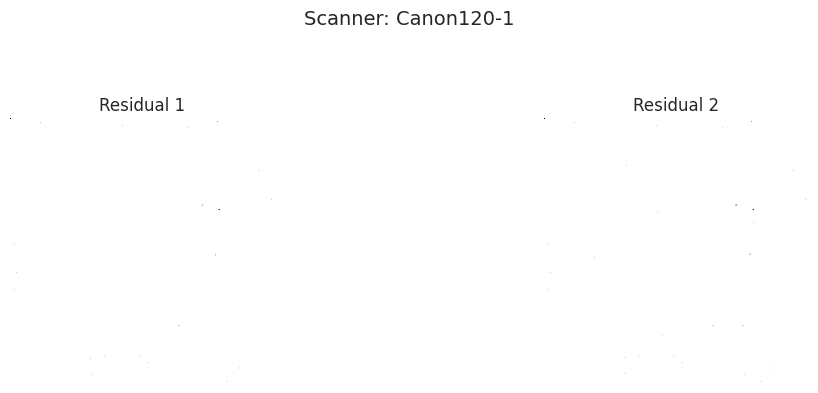

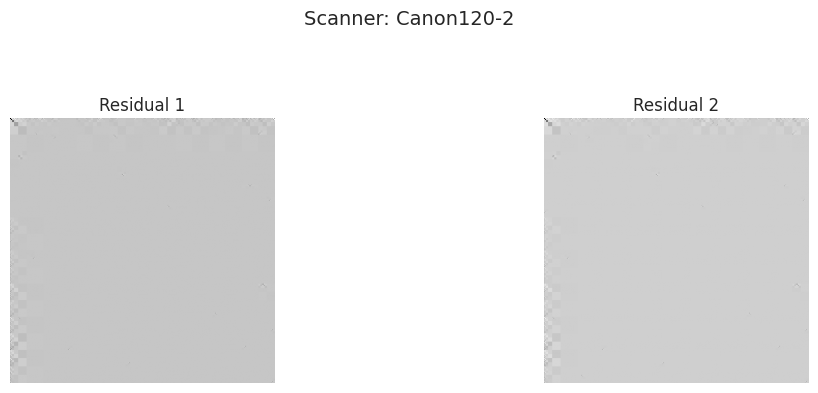

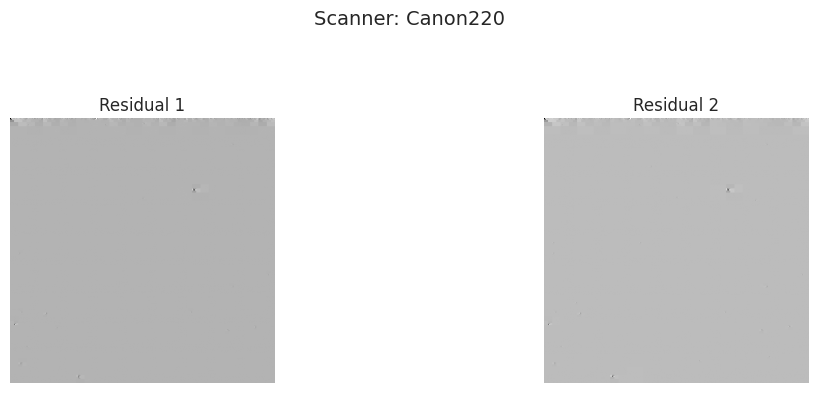

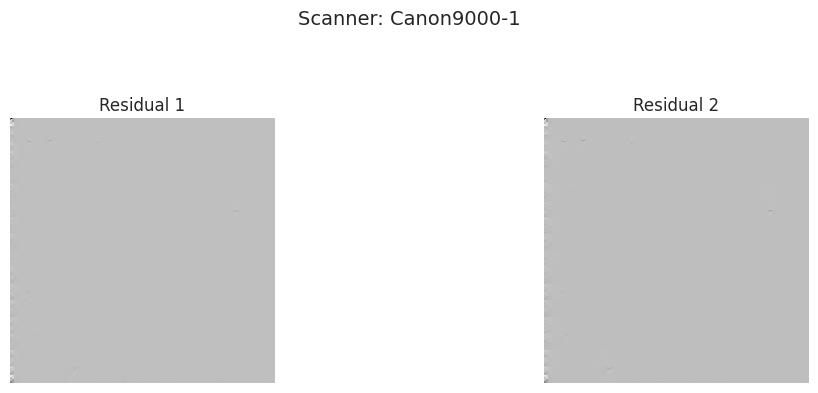

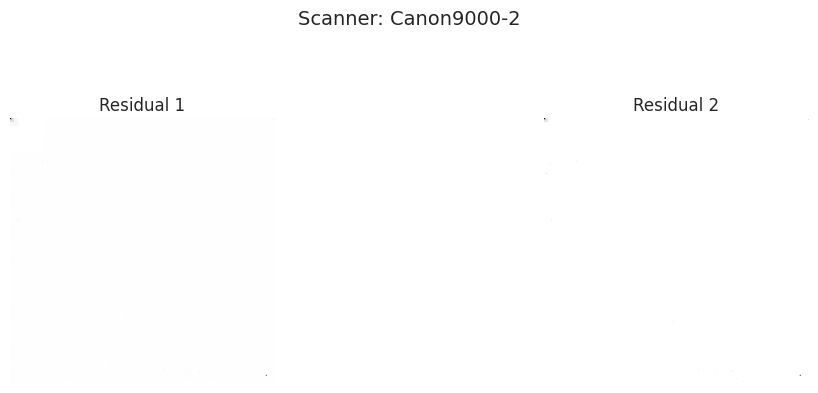

...

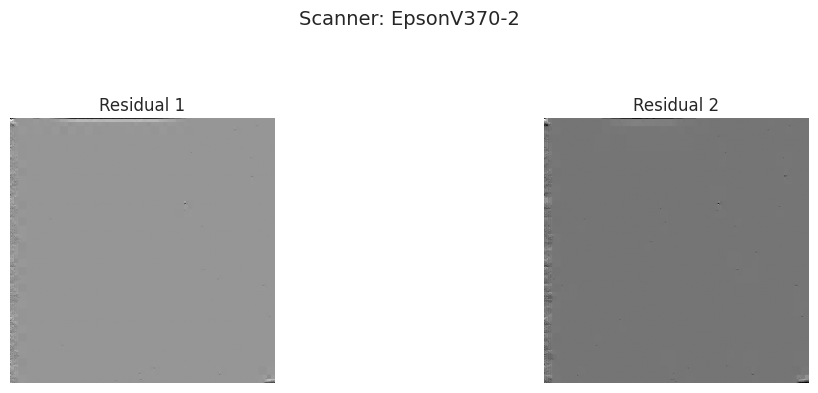

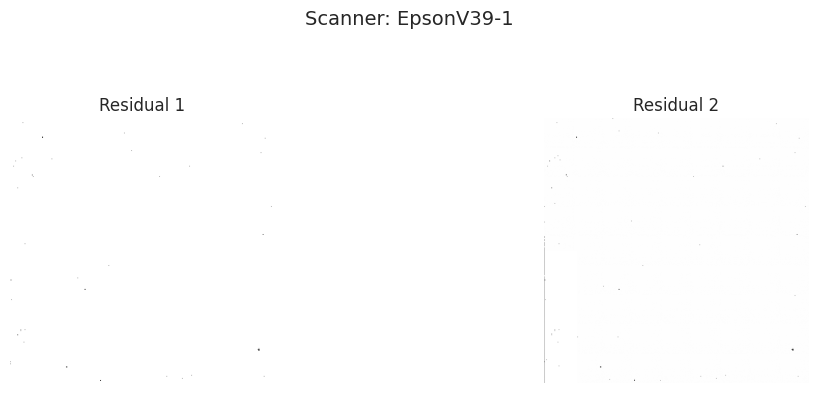

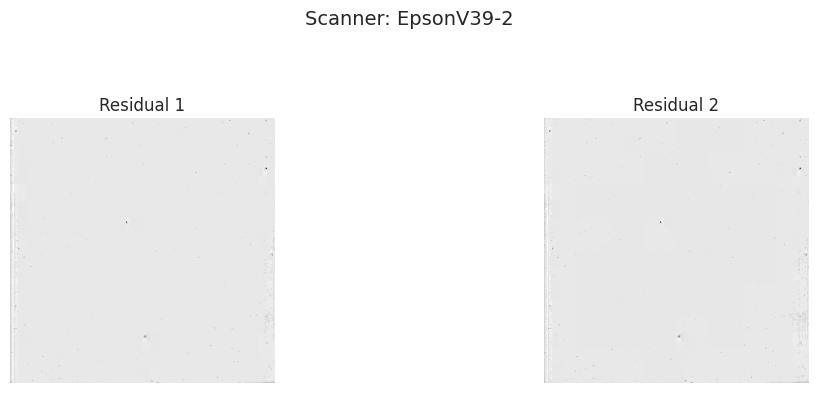

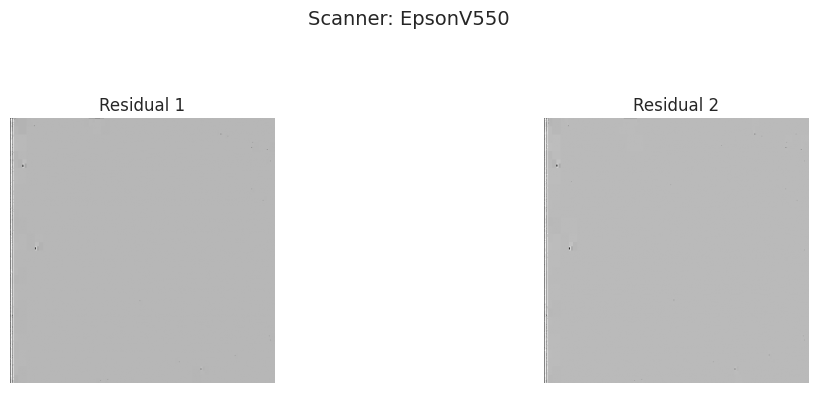

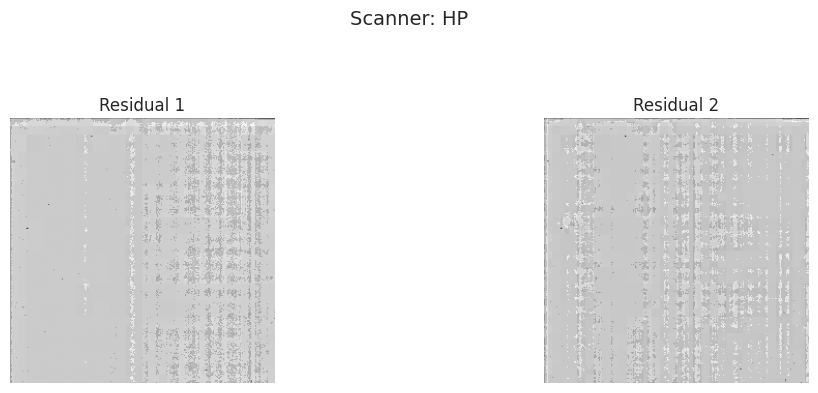

In [ ]:
import pickle
import matplotlib.pyplot as plt

# -------------------------------
# PARAMETERS
# -------------------------------
PICKLE_PATH = "/content/drive/MyDrive/AI Trace Finder/flatfield_preprocess.pkl"
N_SAMPLES_PER_SCANNER = 3  # Number of residuals to visualize per scanner

# -------------------------------
# LOAD DATA
# -------------------------------
with open(PICKLE_PATH, "rb") as f:
    data = pickle.load(f)

scanners = list(data.keys())
print("✅ Loaded scanners:", scanners)

# -------------------------------
# VISUALIZATION
# -------------------------------
for scanner in scanners:
    residuals = data[scanner]
    n_samples = min(len(residuals), N_SAMPLES_PER_SCANNER)

    if n_samples == 0:
        print(f"⚠️ No residuals found for scanner {scanner}")
        continue

    plt.figure(figsize=(12, 4))
    plt.suptitle(f"Scanner: {scanner}", fontsize=14)

    for idx in range(n_samples):
        img = residuals[idx]
        plt.subplot(1, n_samples, idx + 1)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
        plt.title(f"Residual {idx+1}")

    plt.tight_layout(rect=[0, 0, 1, 0.9])
    plt.show()


### **Visualize Official and Wikipedia Preprocessed Images**

✅ Loaded keys: ['Official', 'Wikipedia']
📊 Total available residuals: 4568


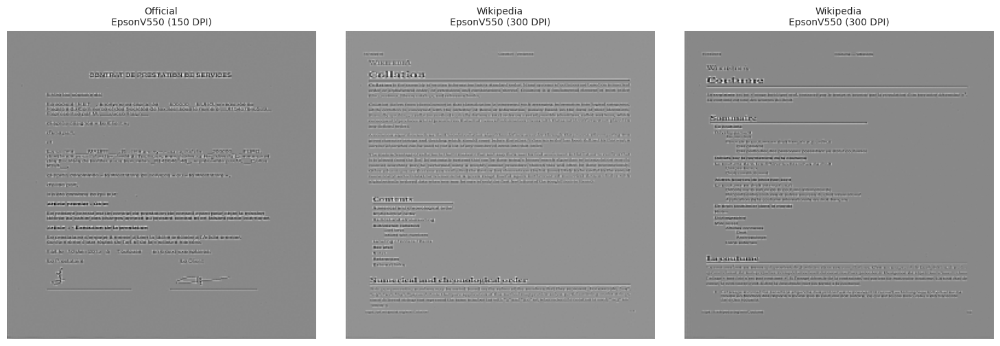

In [ ]:
import pickle
import random
import matplotlib.pyplot as plt

# -------------------------------
# PARAMETERS
# -------------------------------
PICKLE_PATH = "/content/drive/MyDrive/AI Trace Finder/official_wiki_preprocess.pkl"
N_SAMPLES = 3

# -------------------------------
# LOAD DATA
# -------------------------------
with open(PICKLE_PATH, "rb") as f:
    data = pickle.load(f)

print("✅ Loaded keys:", list(data.keys()))  # Expect: ['Official', 'Wikipedia']

# -------------------------------
# COLLECT ALL RESIDUALS
# -------------------------------
all_residuals = []

for dataset_name in ["Official", "Wikipedia"]:
    dataset_dict = data.get(dataset_name, {})
    for scanner, dpi_dict in dataset_dict.items():
        for dpi, images in dpi_dict.items():
            for img in images:
                all_residuals.append((dataset_name, scanner, dpi, img))

print(f"📊 Total available residuals: {len(all_residuals)}")

# -------------------------------
# RANDOM SAMPLING
# -------------------------------
samples = random.sample(all_residuals, min(len(all_residuals), N_SAMPLES))

# -------------------------------
# VISUALIZATION
# -------------------------------
cols = len(samples)
plt.figure(figsize=(5 * cols, 5))
for idx, (dataset, scanner, dpi, img) in enumerate(samples):
    plt.subplot(1, cols, idx + 1)
    plt.imshow(img, cmap="gray")
    plt.title(f"{dataset}\n{scanner} ({dpi} DPI)", fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.show()


## **Feature Visualization and Scanner Differences**

🔄 Creating PCA visualization...


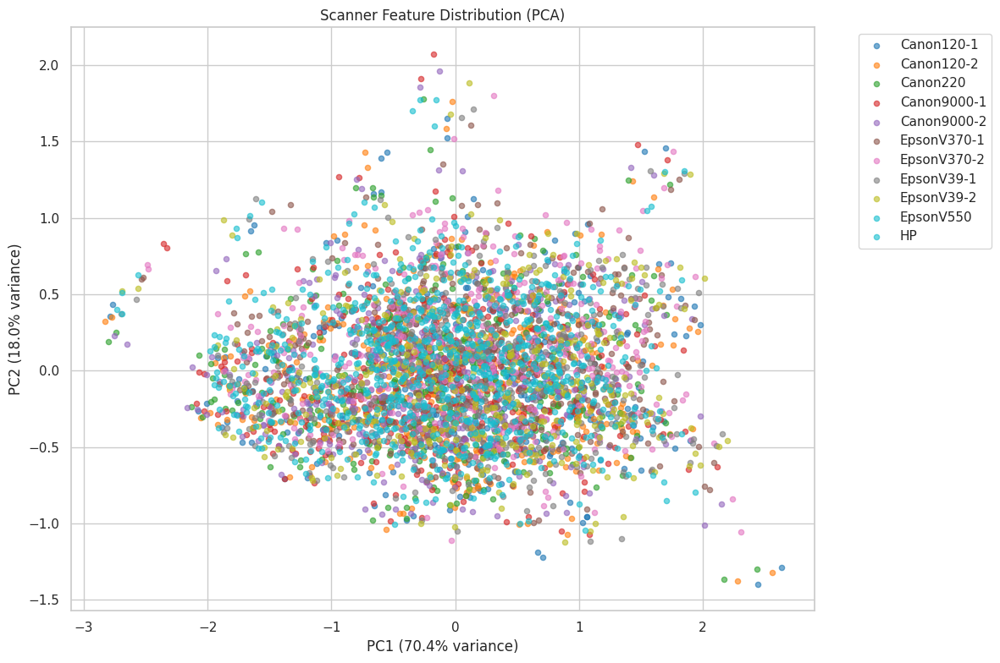

🔄 Creating t-SNE visualization...


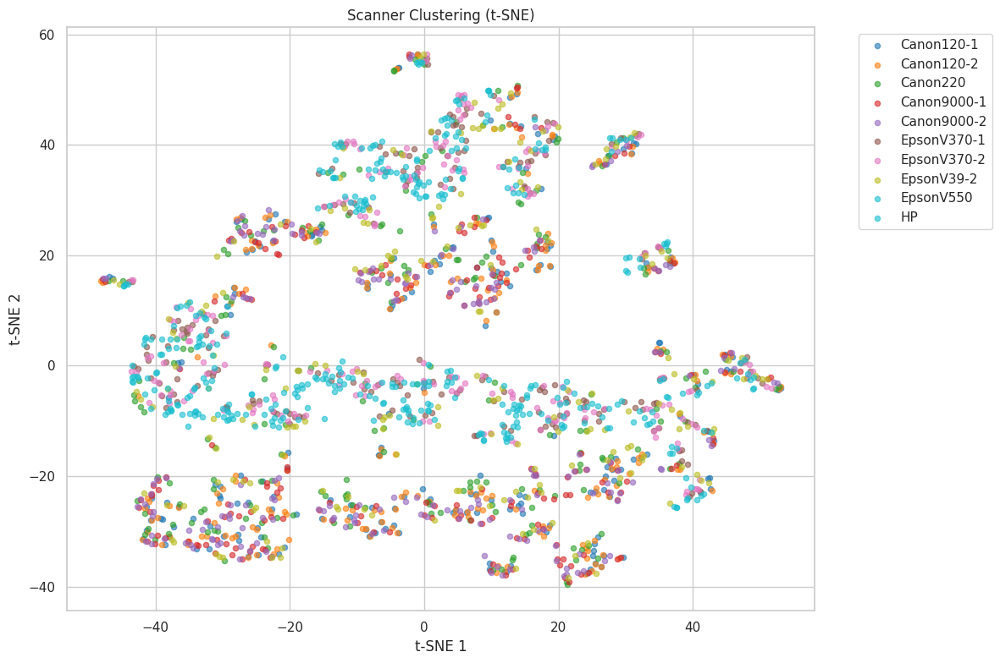

🔄 Computing feature correlations...


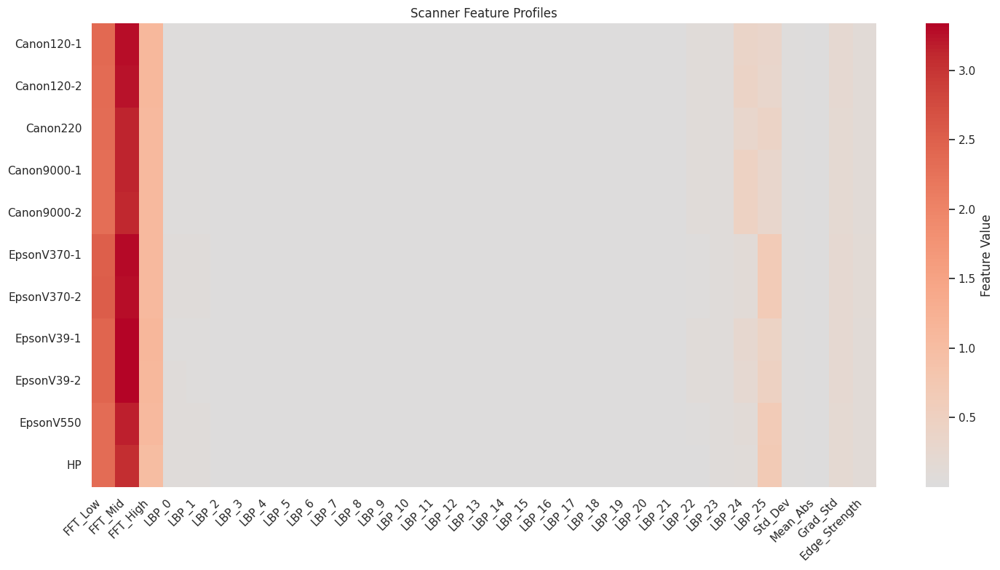

✅ Visualizations saved to /content/drive/MyDrive/AI Trace Finder/


In [ ]:

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Load enhanced features
with open("/content/drive/MyDrive/AI Trace Finder/advanced_features.pkl", "rb") as f:
    data = pickle.load(f)

X = np.array(data["features"])
y = np.array(data["labels"])

# 1. PCA Visualization
print("🔄 Creating PCA visualization...")
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(12, 8))
scanners = np.unique(y)
colors = plt.cm.tab10(np.linspace(0, 1, len(scanners)))

for i, scanner in enumerate(scanners):
    mask = y == scanner
    plt.scatter(X_pca[mask, 0], X_pca[mask, 1],
                c=[colors[i]], label=scanner, alpha=0.6, s=20)

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} variance)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} variance)')
plt.title('Scanner Feature Distribution (PCA)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/AI Trace Finder/pca_visualization.png', dpi=300, bbox_inches='tight')
plt.show()

# 2. t-SNE Visualization
print("🔄 Creating t-SNE visualization...")
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X[:2000])  # Subset for speed
y_subset = y[:2000]

plt.figure(figsize=(12, 8))
for i, scanner in enumerate(scanners):
    mask = y_subset == scanner
    if np.sum(mask) > 0:
        plt.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                    c=[colors[i]], label=scanner, alpha=0.6, s=20)

plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.title('Scanner Clustering (t-SNE)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/AI Trace Finder/tsne_visualization.png', dpi=300, bbox_inches='tight')
plt.show()

# 3. Feature Importance Heatmap
print("🔄 Computing feature correlations...")
feature_names = (['FFT_Low', 'FFT_Mid', 'FFT_High'] +
                [f'LBP_{i}' for i in range(26)] +
                ['Std_Dev', 'Mean_Abs', 'Grad_Std', 'Edge_Strength'])

# Compute mean features per scanner
scanner_profiles = {}
for scanner in scanners:
    mask = y == scanner
    scanner_profiles[scanner] = np.mean(X[mask], axis=0)

# Create heatmap data
heatmap_data = np.array([scanner_profiles[s] for s in scanners])

plt.figure(figsize=(15, 8))
sns.heatmap(heatmap_data,
            xticklabels=feature_names,
            yticklabels=scanners,
            cmap='coolwarm', center=0,
            cbar_kws={'label': 'Feature Value'})
plt.title('Scanner Feature Profiles')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/AI Trace Finder/feature_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Visualizations saved to /content/drive/MyDrive/AI Trace Finder/")


**Visualize Sample scanner fingerprints and Sample residuals from Official Wikipedia Preprocess dataset**

=== Sample residuals from Official dataset ===


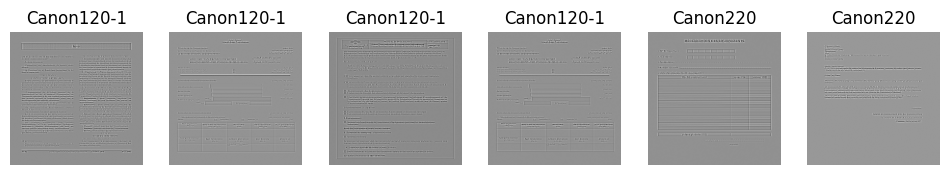

=== Sample scanner fingerprints ===


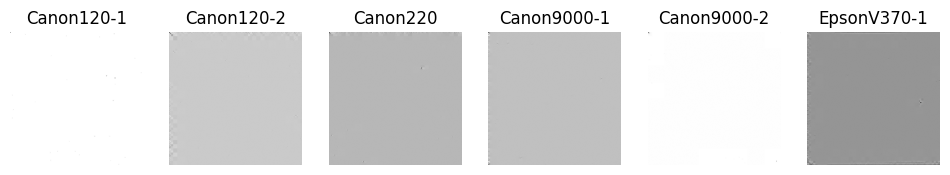

In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ---- Paths ----
RES_PATH   = "/content/drive/MyDrive/AI Trace Finder/official_wiki_preprocess.pkl"
FP_PATH    = "/content/drive/MyDrive/AI Trace Finder/scannerfingerprints.pkl"
ORDER_NPY  = "/content/drive/MyDrive/AI Trace Finder/fp_keys.npy"

# ---- Load residuals ----
with open(RES_PATH, "rb") as f:
    residuals_dict = pickle.load(f)

# ---- Load scanner fingerprints ----
with open(FP_PATH, "rb") as f:
    scanner_fps = pickle.load(f)

# ---- Load fingerprint keys ----
fp_keys = np.load(ORDER_NPY, allow_pickle=True).tolist()

# ---- Helper to plot images ----
def show_images(img_list, titles=None, cmap='gray', figsize=(12,3)):
    n = len(img_list)
    plt.figure(figsize=figsize)
    for i, img in enumerate(img_list):
        plt.subplot(1, n, i+1)
        plt.imshow(img.squeeze(), cmap=cmap)
        if titles:
            plt.title(titles[i])
        plt.axis('off')
    plt.show()

# ---- Display a few residuals from "Official" dataset ----
official_res = []
official_labels = []
for scanner, dpi_dict in residuals_dict["Official"].items():
    for dpi, res_list in dpi_dict.items():
        official_res.extend(res_list[:2])  # first 2 images per dpi
        official_labels.extend([scanner]*len(res_list[:2]))

print("=== Sample residuals from Official dataset ===")
show_images(official_res[:6], official_labels[:6])

# ---- Display a few scanner fingerprints ----
fp_imgs = [scanner_fps[k] for k in fp_keys[:6]]
fp_labels = fp_keys[:6]

print("=== Sample scanner fingerprints ===")
show_images(fp_imgs, fp_labels)


## **Build And Train Hybrid CNN Model(using Wiki and official preprocess and feature and fingerprints Residuals)**

In [ ]:

import os, pickle, pywt, random
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tensorflow.keras.utils import to_categorical
from skimage.feature import local_binary_pattern as sk_lbp

RES_PATH  = "/content/drive/MyDrive/AI Trace Finder/official_wiki_preprocess.pkl"
FP_PATH   = "/content/drive/MyDrive/AI Trace Finder/scannerfingerprints.pkl"
ORDER_NPY = "/content/drive/MyDrive/AI Trace Finder/fp_keys.npy"
ART_DIR   = "/content/drive/MyDrive/AI Trace Finder"
os.makedirs(ART_DIR, exist_ok=True)

# ---- Reproducibility ----
SEED = 42
random.seed(SEED); np.random.seed(SEED); tf.random.set_seed(SEED)

# ---- Load residuals + fingerprints in stable order ----
with open(RES_PATH, "rb") as f:
    residuals_dict = pickle.load(f)
with open(FP_PATH, "rb") as f:
    scanner_fps = pickle.load(f)
fp_keys = np.load(ORDER_NPY, allow_pickle=True).tolist()

# ---- Utilities (NumPy 2.0-safe + residual features) ----
def corr2d(a, b):
    a = a.astype(np.float32).ravel(); b = b.astype(np.float32).ravel()
    a -= a.mean(); b -= b.mean()
    d = np.linalg.norm(a)*np.linalg.norm(b)
    return float((a @ b) / d) if d != 0 else 0.0

def fft_radial_energy(img, K=6):
    f = np.fft.fftshift(np.fft.fft2(img))
    mag = np.abs(f)
    h, w = mag.shape; cy, cx = h//2, w//2
    yy, xx = np.ogrid[:h, :w]
    r = np.sqrt((yy - cy)**2 + (xx - cx)**2)
    rmax = r.max() + 1e-6
    bins = np.linspace(0, rmax, K+1)
    feats = []
    for i in range(K):
        m = (r >= bins[i]) & (r < bins[i+1])
        feats.append(float(mag[m].mean() if m.any() else 0.0))
    return feats

def lbp_hist_safe(img, P=8, R=1.0):
    # Float-safe: normalize and cast to uint8, use np.ptp for NumPy 2.0
    rng = float(np.ptp(img))
    if rng < 1e-12:
        g = np.zeros_like(img, dtype=np.float32)
    else:
        g = (img - float(np.min(img))) / (rng + 1e-8)
    g8 = (g * 255.0).astype(np.uint8)
    codes = sk_lbp(g8, P=P, R=R, method="uniform")
    n_bins = P + 2  # uniform -> P+2
    hist, _ = np.histogram(codes, bins=np.arange(n_bins+1), density=True)
    return hist.astype(np.float32).tolist()  # length 10 for P=8

# ---- Build aligned dataset: (residual image, 27-D features, label) ----
X_img, X_feat, y = [], [], []
for dataset_name in ["Official", "Wikipedia"]:
    for scanner, dpi_dict in residuals_dict[dataset_name].items():
        for dpi, res_list in dpi_dict.items():
            for res in res_list:
                # Image branch
                X_img.append(np.expand_dims(res, axis=-1))  # (256,256,1)
                # Feature branch: 11 PRNU corr + 6 FFT energy + 10 LBP
                v_corr = [corr2d(res, scanner_fps[k]) for k in fp_keys]   # 11
                v_fft  = fft_radial_energy(res, K=6)                      # 6
                v_lbp  = lbp_hist_safe(res, P=8, R=1.0)                   # 10
                X_feat.append(v_corr + v_fft + v_lbp)                     # 27 total
                y.append(scanner)

X_img  = np.array(X_img, dtype=np.float32)    # (N,256,256,1)
X_feat = np.array(X_feat, dtype=np.float32)   # (N,27)
y       = np.array(y)

# ---- Encode labels and split ----
le = LabelEncoder()
y_int = le.fit_transform(y)
num_classes = len(le.classes_)
y_cat = to_categorical(y_int, num_classes)

X_img_tr, X_img_te, X_feat_tr, X_feat_te, y_tr, y_te = train_test_split(
    X_img, X_feat, y_cat, test_size=0.2, random_state=SEED, stratify=y_int
)

# Feature scaling on train only
scaler = StandardScaler()
X_feat_tr = scaler.fit_transform(X_feat_tr)
X_feat_te = scaler.transform(X_feat_te)

# Persist artifacts
with open(os.path.join(ART_DIR, "hybrid_label_encoder.pkl"), "wb") as f:
    pickle.dump(le, f)
with open(os.path.join(ART_DIR, "hybrid_feat_scaler.pkl"), "wb") as f:
    pickle.dump(scaler, f)

print("Hybrid train:", X_img_tr.shape, X_feat_tr.shape, y_tr.shape)
print("Hybrid test :", X_img_te.shape, X_feat_te.shape, y_te.shape)

# ---- Hybrid model: fixed high-pass residual frontend + feature MLP ----
img_in  = keras.Input(shape=(256,256,1), name="residual")
feat_in = keras.Input(shape=(27,),      name="handcrafted")

# Fixed high-pass kernel (content suppression)
hp_kernel = np.array([[-1,-1,-1],
                      [-1, 8,-1],
                      [-1,-1,-1]], dtype=np.float32).reshape((3,3,1,1))

hp = layers.Conv2D(1, (3,3), padding="same", use_bias=False, trainable=False, name="hp_filter")(img_in)

x = layers.Conv2D(32, (3,3), padding="same", activation=None)(hp)
x = layers.BatchNormalization()(x); x = layers.ReLU()(x)
x = layers.Conv2D(32, (3,3), padding="same", activation="relu")(x)
x = layers.MaxPooling2D((2,2))(x); x = layers.Dropout(0.25)(x)

x = layers.Conv2D(64, (3,3), padding="same", activation=None)(x)
x = layers.BatchNormalization()(x); x = layers.ReLU()(x)
x = layers.Conv2D(64, (3,3), padding="same", activation="relu")(x)
x = layers.MaxPooling2D((2,2))(x); x = layers.Dropout(0.25)(x)

x = layers.Conv2D(128, (3,3), padding="same", activation=None)(x)
x = layers.BatchNormalization()(x); x = layers.ReLU()(x)
x = layers.Conv2D(128, (3,3), padding="same", activation="relu")(x)
x = layers.MaxPooling2D((2,2))(x); x = layers.Dropout(0.30)(x)

x = layers.Conv2D(256, (3,3), padding="same", activation=None)(x)
x = layers.BatchNormalization()(x); x = layers.ReLU()(x)
x = layers.GlobalAveragePooling2D()(x)  # CNN embedding

# Feature branch
f = layers.Dense(64, activation=None)(feat_in)
f = layers.BatchNormalization()(f); f = layers.ReLU()(f)
f = layers.Dropout(0.20)(f)

# Fuse and classify
z = layers.Concatenate()([x, f])
z = layers.Dense(256, activation="relu")(z)
z = layers.Dropout(0.40)(z)
out = layers.Dense(num_classes, activation="softmax")(z)

model = keras.Model(inputs=[img_in, feat_in], outputs=out, name="scanner_hybrid")
model.get_layer("hp_filter").set_weights([hp_kernel])

opt = keras.optimizers.Adam(learning_rate=1e-3)
model.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["accuracy"])
model.summary()

# ---- tf.data pipelines ----
BATCH = 32
train_ds = tf.data.Dataset.from_tensor_slices(((X_img_tr, X_feat_tr), y_tr))\
    .shuffle(len(y_tr), reshuffle_each_iteration=True)\
    .batch(BATCH).prefetch(tf.data.AUTOTUNE)
val_ds   = tf.data.Dataset.from_tensor_slices(((X_img_te, X_feat_te), y_te))\
    .batch(BATCH).prefetch(tf.data.AUTOTUNE)

# ---- Callbacks (.keras modern format) ----
ckpt_path = os.path.join(ART_DIR, "scanner_hybrid.keras")
callbacks = [
    keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True, monitor="val_accuracy"),
    keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=5, min_lr=1e-6, monitor="val_accuracy"),
    keras.callbacks.ModelCheckpoint(ckpt_path, save_best_only=True, monitor="val_accuracy"),
]

# ---- Train ----
EPOCHS = 50
history = model.fit(train_ds, epochs=EPOCHS, validation_data=val_ds, callbacks=callbacks, verbose=1)

# ---- Save final model + history ----
final_path = os.path.join(ART_DIR, "scanner_hybrid_final.keras")
model.save(final_path)
with open(os.path.join(ART_DIR, "hybrid_training_history.pkl"), "wb") as f:
    pickle.dump(history.history, f)
print("✅ Hybrid CNN training complete:", ckpt_path)

# ==============================
# 5C.3 — Hybrid Inference (matches Step 2B pywt/Haar denoiser)
# ==============================

# Reload for inference (optional)
hyb_model = tf.keras.models.load_model(ckpt_path)
with open(os.path.join(ART_DIR, "hybrid_label_encoder.pkl"), "rb") as f:
    le_inf = pickle.load(f)
with open(os.path.join(ART_DIR, "hybrid_feat_scaler.pkl"), "rb") as f:
    scaler_inf = pickle.load(f)
with open(FP_PATH, "rb") as f:
    scanner_fps_inf = pickle.load(f)
fp_keys_inf = np.load(ORDER_NPY, allow_pickle=True).tolist()

IMG_SIZE = (256,256)

def preprocess_residual_pywt(path):
    import cv2
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    if img is None: raise ValueError(f"Cannot read {path}")
    if img.ndim == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, IMG_SIZE, interpolation=cv2.INTER_AREA)
    img = img.astype(np.float32) / 255.0
    cA, (cH, cV, cD) = pywt.dwt2(img, 'haar')
    cH.fill(0); cV.fill(0); cD.fill(0)
    den = pywt.idwt2((cA, (cH, cV, cD)), 'haar')
    return (img - den).astype(np.float32)

def make_feats_from_res(res):
    v_corr = [corr2d(res, scanner_fps_inf[k]) for k in fp_keys_inf]  # 11
    v_fft  = fft_radial_energy(res, K=6)                              # 6
    v_lbp  = lbp_hist_safe(res, P=8, R=1.0)                           # 10
    v = np.array(v_corr + v_fft + v_lbp, dtype=np.float32).reshape(1,-1)
    v = scaler_inf.transform(v)
    return v

def predict_scanner_hybrid(image_path):
    res   = preprocess_residual_pywt(image_path)
    x_img = np.expand_dims(res, axis=(0,-1))      # (1,256,256,1)
    x_ft  = make_feats_from_res(res)              # (1,27)
    prob  = hyb_model.predict([x_img, x_ft], verbose=0)
    idx   = int(np.argmax(prob))
    label = le_inf.classes_[idx]
    conf  = float(prob[idx]*100.0)
    return label, conf




Hybrid train: (3654, 256, 256, 1) (3654, 27) (3654, 11)
Hybrid test : (914, 256, 256, 1) (914, 27) (914, 11)


Model: "scanner_hybrid"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ residual            │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ hp_filter (Conv2D)  │ (None, 256, 256,  │          9 │ residual[0][0]    │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        320 │ hp_filter[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      9,248 │ re_lu[0][0]       │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128, 128,  │          0 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     18,496 │ dropout[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     36,928 │ re_lu_1[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 64, 64,    │          0 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │     73,856 │ dropout_1[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 64, 64,    │          0 │ batch_normalizat

 Total params: 670,580 (2.56 MB)

 Trainable params: 669,483 (2.55 MB)

 Non-trainable params: 1,097 (4.29 KB)

Epoch 1/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 77s 378ms/step - accuracy: 0.2846 - loss: 2.0197 - val_accuracy: 0.3939 - val_loss: 1.8268 - learning_rate: 0.0010
Epoch 2/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 22s 187ms/step - accuracy: 0.4858 - loss: 1.3663 - val_accuracy: 0.4869 - val_loss: 1.4334 - learning_rate: 0.0010
Epoch 3/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 22s 192ms/step - accuracy: 0.4928 - loss: 1.2752 - val_accuracy: 0.5022 - val_loss: 1.3086 - learning_rate: 0.0010
Epoch 4/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 22s 190ms/step - accuracy: 0.5311 - loss: 1.1857 - val_accuracy: 0.5624 - val_loss: 1.1746 - learning_rate: 0.0010
Epoch 5/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 22s 188ms/step - accuracy: 0.5418 - loss: 1.2040 - val_accuracy: 0.6269 - val_loss: 0.9721 - learning_rate: 0.0010
Epoch 6/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 21s 187ms/step - accuracy: 0.5641 - loss: 1.0984 - val_accuracy: 0.5416 - val_loss: 1.3287 - learning_rate: 0.0010
Epoch 7/50
115/115 ━━━━━━━━━━━━━━━━━━━━ 22s 187ms/step - accuracy: 0.6

## **Model Evaluvation**

📊 Final Metrics:
✅ Train Accuracy:      0.9327
✅ Validation Accuracy: 0.9114
📉 Train Loss:          0.1763
📉 Validation Loss:     0.2154


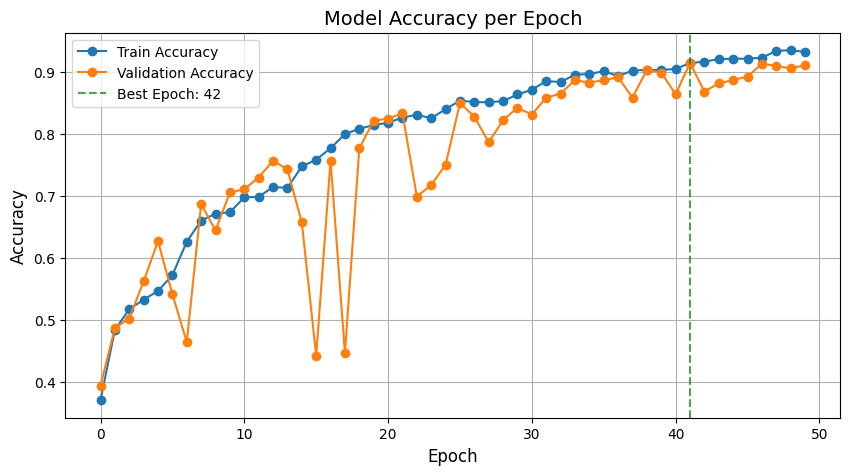

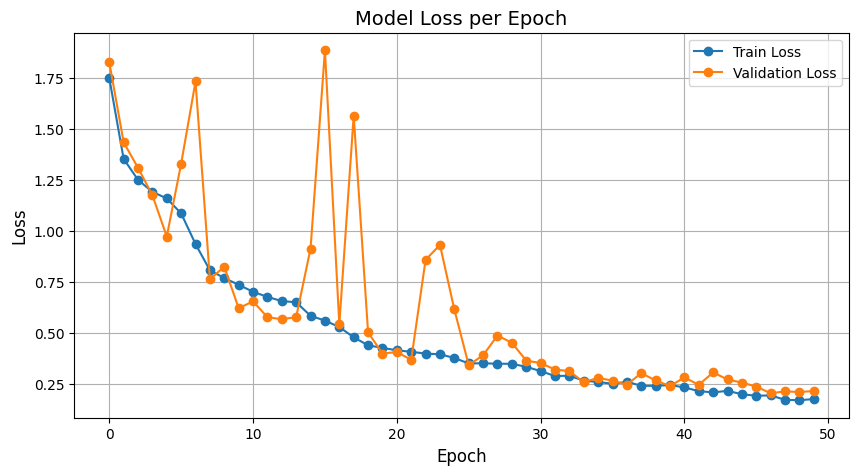

In [ ]:
import pickle, os
import matplotlib.pyplot as plt

ART_DIR = "/content/drive/MyDrive/AI Trace Finder"

# Load saved training history
with open(os.path.join(ART_DIR, "hybrid_training_history.pkl"), "rb") as f:
    history_dict = pickle.load(f)

# ✅ Print Final Accuracy and Loss
final_train_acc  = history_dict['accuracy'][-1]
final_val_acc    = history_dict['val_accuracy'][-1]
final_train_loss = history_dict['loss'][-1]
final_val_loss   = history_dict['val_loss'][-1]

print("📊 Final Metrics:")
print(f"✅ Train Accuracy:      {final_train_acc:.4f}")
print(f"✅ Validation Accuracy: {final_val_acc:.4f}")
print(f"📉 Train Loss:          {final_train_loss:.4f}")
print(f"📉 Validation Loss:     {final_val_loss:.4f}")

# ✅ Plot Accuracy
plt.figure(figsize=(10,5))
plt.plot(history_dict['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history_dict['val_accuracy'], label='Validation Accuracy', marker='o')

# Highlight Best Validation Accuracy
best_epoch = history_dict['val_accuracy'].index(max(history_dict['val_accuracy']))
plt.axvline(x=best_epoch, color='green', linestyle='--', alpha=0.7, label=f'Best Epoch: {best_epoch+1}')

plt.title('Model Accuracy per Epoch', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

# ✅ Plot Loss
plt.figure(figsize=(10,5))
plt.plot(history_dict['loss'], label='Train Loss', marker='o')
plt.plot(history_dict['val_loss'], label='Validation Loss', marker='o')
plt.title('Model Loss per Epoch', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# Auto-sample per scanner and run batch inference with confidences

import os, csv, numpy as np
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.utils.multiclass import unique_labels

OUT_CSV = "/content/drive/MyDrive/AI Trace Finder/metrics/inference_hybrid.csv"
ROOT_OFF = "/content/drive/MyDrive/AI Trace Finder/Official"
ROOT_WIK = "/content/drive/MyDrive/AI Trace Finder/Wikipedia"

def parse_gt_from_path(p):
    parts = p.split("/")
    if "Official" in parts:
        i = parts.index("Official")
    elif "Wikipedia" in parts:
        i = parts.index("Wikipedia")
    else:
        return None
    return parts[i+1] if i+1 < len(parts) else None

def collect_samples(root_dir, per_scanner=10):
    paths = []
    for scanner in sorted(os.listdir(root_dir)):
        sp = os.path.join(root_dir, scanner)
        if not os.path.isdir(sp): continue
        picked = 0
        # iterate 150 and 300 folders if present
        for dpi in sorted(os.listdir(sp)):
            dp = os.path.join(sp, dpi)
            if not os.path.isdir(dp): continue
            for f in sorted(os.listdir(dp)):
                if f.lower().endswith((".tif",".tiff",".png",".jpg",".jpeg")):
                    paths.append(os.path.join(dp, f))
                    picked += 1
                    if picked >= per_scanner: break
            if picked >= per_scanner: break
    return paths

def topk_indices_1d(p, k=3):
    p = np.asarray(p).ravel()
    k = min(k, p.size)
    idx = np.argpartition(p, -k)[-k:]
    idx = idx[np.argsort(p[idx])[::-1]]
    return idx

# Collect 10 per scanner from both sets (adjust per_scanner if needed)
test_paths = collect_samples(ROOT_OFF, per_scanner=10) + collect_samples(ROOT_WIK, per_scanner=10)
print("Total test files:", len(test_paths))

rows = [["path","pred_label","conf_pct","top3_labels","top3_conf","gt_label","correct"]]
y_true, y_pred = [], []

for p in test_paths:
    try:
        res   = preprocess_residual_pywt(p)
        x_img = np.expand_dims(res, axis=(0,-1))
        x_ft  = make_feats_from_res(res)
        prob  = hyb_model.predict([x_img, x_ft], verbose=0)
        prob  = np.asarray(prob).ravel()     # 1D softmax vector

        top1  = int(np.argmax(prob))
        label = le_inf.classes_[top1]
        conf  = float(prob[top1] * 100.0)

        top3_idx = topk_indices_1d(prob, k=3)
        top3_labels = [le_inf.classes_[i] for i in top3_idx]
        top3_conf   = [float(prob[i]*100.0) for i in top3_idx]

        gt = parse_gt_from_path(p)
        correct = (gt == label) if gt is not None else ""
        rows.append([p, label, f"{conf:.2f}",
                    ";".join(top3_labels),
                    ";".join(f"{c:.2f}" for c in top3_conf),
                    gt if gt else "", correct])

        if gt is not None:
            y_true.append(gt); y_pred.append(label)
    except Exception as e:
        rows.append([p, "ERROR", "", "", "", "", f"err={e}"])

# Write CSV
os.makedirs(os.path.dirname(OUT_CSV), exist_ok=True)
with open(OUT_CSV, "w", newline="") as fh:
    csv.writer(fh).writerows(rows)
print("Wrote:", OUT_CSV)

# Metrics: present labels only (no undefined warnings)
present = unique_labels(y_true, y_pred)
print(classification_report(y_true, y_pred, labels=present))

# Also full report on all 11 classes with zero_division=0
print(classification_report(y_true, y_pred, labels=list(le_inf.classes_), zero_division=0))

# Confusion matrix on present labels
print("Confusion matrix:\n", confusion_matrix(y_true, y_pred, labels=present))


Total test files: 220
Wrote: /content/drive/MyDrive/AI Trace Finder/metrics/inference_hybrid.csv
              precision    recall  f1-score   support

  Canon120-1       0.81      0.85      0.83        20
  Canon120-2       0.50      0.80      0.62        20
    Canon220       1.00      0.80      0.89        20
 Canon9000-1       0.84      0.80      0.82        20
 Canon9000-2       0.81      0.85      0.83        20
 EpsonV370-1       1.00      0.95      0.97        20
 EpsonV370-2       0.95      1.00      0.98        20
  EpsonV39-1       1.00      0.80      0.89        20
  EpsonV39-2       1.00      0.75      0.86        20
   EpsonV550       1.00      1.00      1.00        20
          HP       1.00      1.00      1.00        20

    accuracy                           0.87       220
   macro avg       0.90      0.87      0.88       220
weighted avg       0.90      0.87      0.88       220

              precision    recall  f1-score   support

  Canon120-1       0.81      0.85  

### **Test The Model**

In [ ]:

import numpy as np

print("Loaded fingerprints, fixed key order, and model.")


test_paths = [
 "/content/drive/MyDrive/AI Trace Finder/Official/Canon120-1/150/s1_60.tif",
  "/content/drive/MyDrive/AI Trace Finder/Official/Canon120-2/300/s2_40.tif",
  "/content/drive/MyDrive/AI Trace Finder/Official/Canon220/150/s3_25.tif",
  "/content/drive/MyDrive/AI Trace Finder/Official/Canon9000-1/300/s4_75.tif",
  "/content/drive/MyDrive/AI Trace Finder/Official/Canon9000-2/150/s5_10.tif",
  "/content/drive/MyDrive/AI Trace Finder/Wikipedia/Canon120-1/300/s1_5.tif",
  "/content/drive/MyDrive/AI Trace Finder/Wikipedia/Canon220/150/s3_1.tif",
  "/content/drive/MyDrive/AI Trace Finder/Wikipedia/Canon9000-1/300/s4_5.tif",
  "/content/drive/MyDrive/AI Trace Finder/Wikipedia/EpsonV39-2/150/s9_66.tif",
  "/content/drive/MyDrive/AI Trace Finder/Wikipedia/HP/150/s11_1.tif",
]

for p in test_paths:
    # Residual + features (match training)
    res   = preprocess_residual_pywt(p)
    x_img = np.expand_dims(res, axis=(0,-1))
    x_ft  = make_feats_from_res(res)

    # Predict -> flatten to 1D softmax vector
    prob  = hyb_model.predict([x_img, x_ft], verbose=0)
    prob  = np.asarray(prob).ravel()

    idx   = int(np.argmax(prob))
    label = le_inf.classes_[idx]
    conf  = float(prob[idx] * 100.0)
    print(f"{p} -> {label} | {conf:.2f}%")


Loaded fingerprints, fixed key order, and model.
/content/drive/MyDrive/AI Trace Finder/Official/Canon120-1/150/s1_60.tif -> Canon120-1 | 85.99%
/content/drive/MyDrive/AI Trace Finder/Official/Canon120-2/300/s2_40.tif -> Canon120-2 | 80.89%
/content/drive/MyDrive/AI Trace Finder/Official/Canon220/150/s3_25.tif -> Canon220 | 81.42%
/content/drive/MyDrive/AI Trace Finder/Official/Canon9000-1/300/s4_75.tif -> Canon9000-2 | 53.99%
/content/drive/MyDrive/AI Trace Finder/Official/Canon9000-2/150/s5_10.tif -> Canon9000-2 | 80.89%
/content/drive/MyDrive/AI Trace Finder/Wikipedia/Canon120-1/300/s1_5.tif -> Canon120-2 | 79.88%
/content/drive/MyDrive/AI Trace Finder/Wikipedia/Canon220/150/s3_1.tif -> Canon220 | 96.93%
/content/drive/MyDrive/AI Trace Finder/Wikipedia/Canon9000-1/300/s4_5.tif -> Canon9000-1 | 99.94%
/content/drive/MyDrive/AI Trace Finder/Wikipedia/EpsonV39-2/150/s9_66.tif -> EpsonV39-2 | 93.93%
/content/drive/MyDrive/AI Trace Finder/Wikipedia/HP/150/s11_1.tif -> HP | 99.99%


In [ ]:
import pickle, numpy as np, tensorflow as tf

# Example Drive paths — adjust only if files are in a different Drive folder
model_path = "/content/drive/MyDrive/AI Trace Finder/scanner_hybrid.keras"
le_path    = "/content/drive/MyDrive/AI Trace Finder/hybrid_label_encoder.pkl"
scaler_path= "/content/drive/MyDrive/AI Trace Finder/hybrid_feat_scaler.pkl"
fps_path   = "/content/drive/MyDrive/AI Trace Finder/scannerfingerprints.pkl"
keys_path  = "/content/drive/MyDrive/AI Trace Finder/fp_keys.npy"

# Load from Drive into memory
hyb_model = tf.keras.models.load_model(model_path)
with open(le_path, "rb") as f:     le_inf     = pickle.load(f)
with open(scaler_path, "rb") as f: scaler_inf = pickle.load(f)
with open(fps_path, "rb") as f:    scanner_fps_inf = pickle.load(f)
fp_keys_inf = np.load(keys_path, allow_pickle=True).tolist()

# Save to /content for download
tf.keras.models.save_model(hyb_model, "/content/scanner_hybrid.keras")
with open("/content/hybrid_label_encoder.pkl", "wb") as f: pickle.dump(le_inf, f)
with open("/content/hybrid_feat_scaler.pkl", "wb") as f: pickle.dump(scaler_inf, f)
with open("/content/scannerfingerprints.pkl", "wb") as f: pickle.dump(scanner_fps_inf, f)
np.save("/content/fp_keys.npy", np.array(fp_keys_inf, dtype=object))


# **Objective 2**

### **Install Requirements**

In [ ]:
!pip -q install pymupdf

import os, glob, csv, pickle, random
from pathlib import Path
import numpy as np
import cv2, pywt
from PIL import Image
from tqdm import tqdm
import fitz  # PyMuPDF

from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from sklearn.svm import SVC
from skimage.feature import local_binary_pattern as sk_lbp

SEED = 42
random.seed(SEED); np.random.seed(SEED)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.1/24.1 MB 33.7 MB/s eta 0:00:00


## **Define Dataset**

In [ ]:
import os

ROOT = "/content/drive/MyDrive/AI Trace Finder"

# Originals PDFs to convert → TIFF
ORIG_PDF_OFF = f"{ROOT}/Originals/official"
ORIG_PDF_WIK = f"{ROOT}/Originals/wikipedia"
CONV_OUT     = f"{ROOT}/Originals_tif"           # output for converted TIFFs
os.makedirs(CONV_OUT, exist_ok=True)

# Tampered images TIFFs
TAMP_ROOT     = f"{ROOT}/Tampered images"
TAMP_ORIG_TIF = f"{TAMP_ROOT}/Original"                          # clean (0)
TAMP_COPY_TIF = f"{TAMP_ROOT}/Tampered/Copy-move"                # tampered (1)
TAMP_RETO_TIF = f"{TAMP_ROOT}/Tampered/Retouching"               # tampered (1)
TAMP_SPLI_TIF = f"{TAMP_ROOT}/Tampered/Splicing"                 # tampered (1)

# Artifacts / manifests
ART_DIR      = f"{ROOT}/artifacts_tamper"
MANIFEST_CSV = f"{ROOT}/manifests/tamper_manifest.csv"
os.makedirs(ART_DIR, exist_ok=True)
os.makedirs(os.path.dirname(MANIFEST_CSV), exist_ok=True)


### **EDA On Original and Tampered Images**

Original images: 34
Copy-move tampered images: 34
Retouching tampered images: 34
Splicing tampered images: 34

Dataset summary:
            height                                                          \
            count         mean        std     min     25%     50%     75%   
label                                                                       
Copy-move    34.0  3499.794118  12.727397  3471.0  3487.0  3508.0  3508.0   
Original     34.0  3499.794118  12.727397  3471.0  3487.0  3508.0  3508.0   
Retouching   34.0  3499.794118  12.727397  3471.0  3487.0  3508.0  3508.0   
Splicing     34.0  3499.794118  12.727397  3471.0  3487.0  3508.0  3508.0   

                   width                                                 \
               max count         mean       std     min     25%     50%   
label                                                                     
Copy-move   3508.0  34.0  2480.323529  0.474858  2480.0  2480.0  2480.0   
Original    3508.0  34.0  2480.

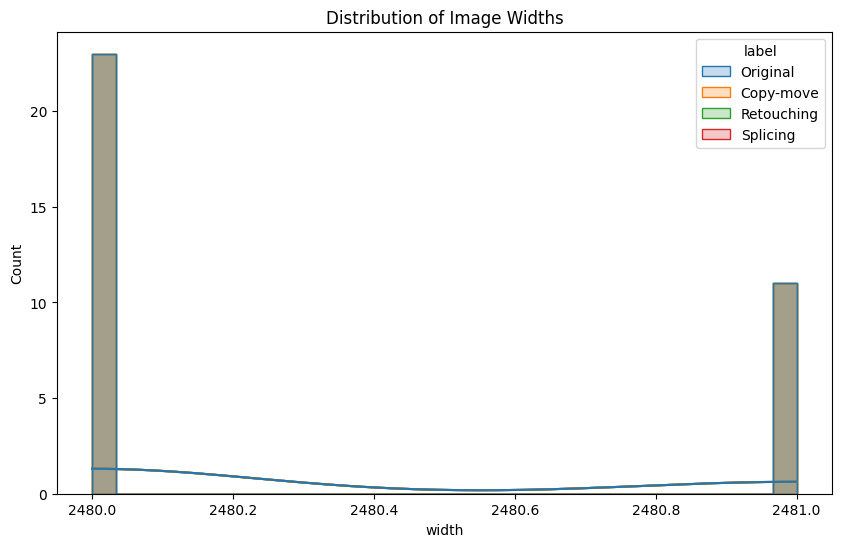

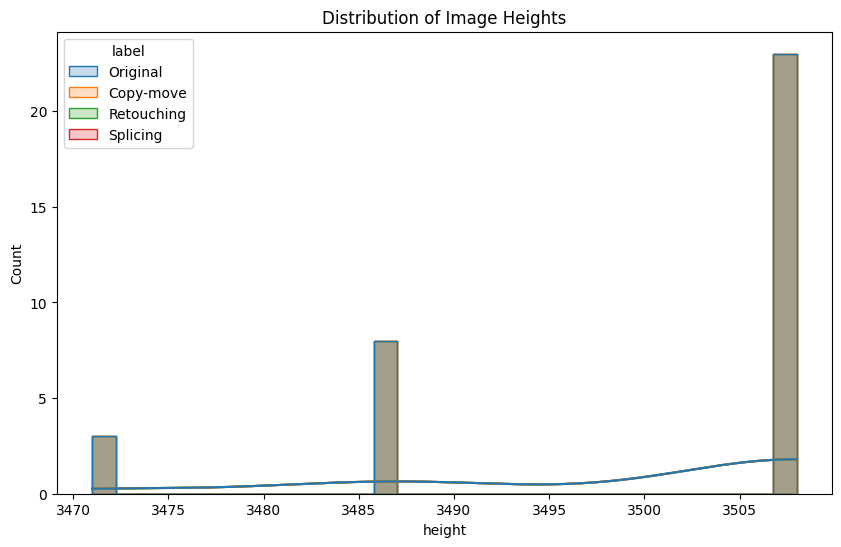

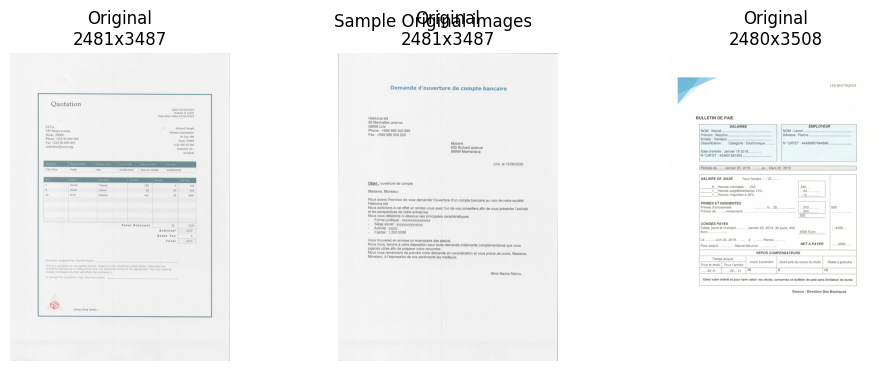

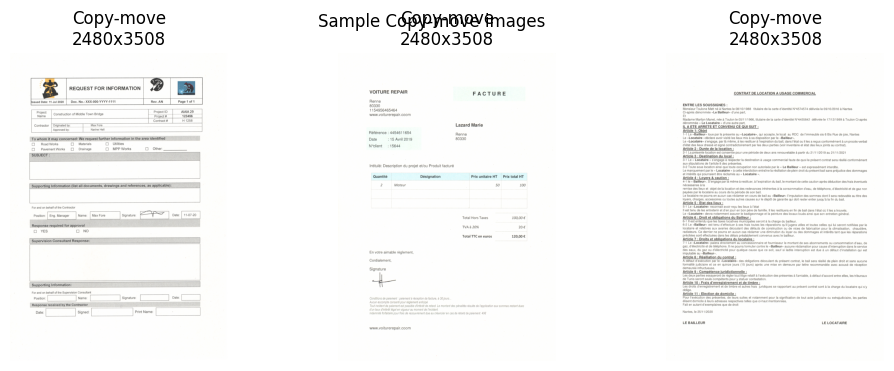

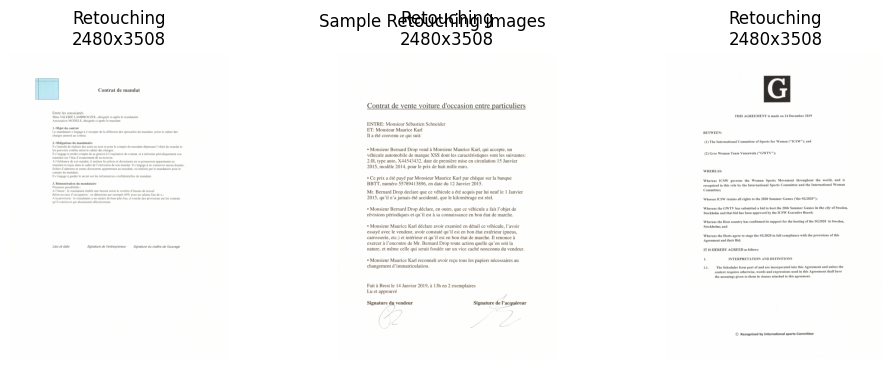

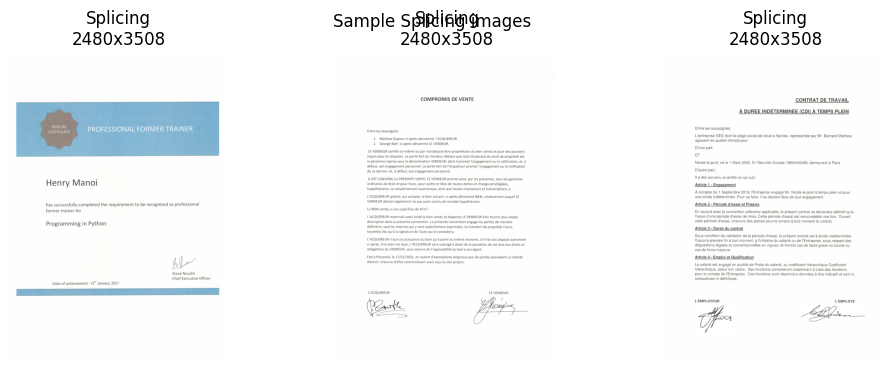

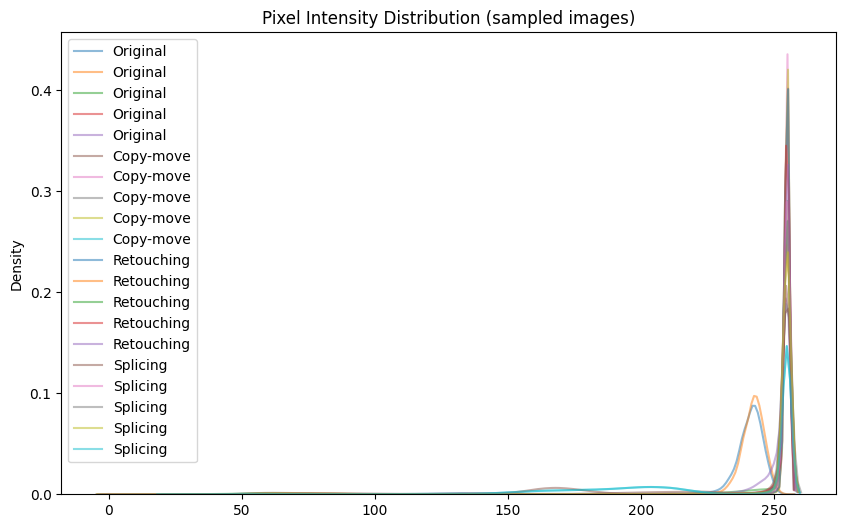

In [ ]:
import os, glob
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Paths
orig_dir = f"{ROOT}/Tampered images/Original"
tamper_dir = f"{ROOT}/Tampered images/Tampered"

# Collect image paths
orig_imgs = glob.glob(os.path.join(orig_dir, "*.tif"))
tamper_types = ["Copy-move", "Retouching", "Splicing"]

tamper_imgs = {tt: glob.glob(os.path.join(tamper_dir, tt, "*.tif")) for tt in tamper_types}

# === 1. Basic Counts ===
print("Original images:", len(orig_imgs))
for tt in tamper_types:
    print(f"{tt} tampered images: {len(tamper_imgs[tt])}")

# === 2. Image Metadata Extraction ===
def get_image_info(path, label):
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    h, w, c = img.shape
    return {"path": path, "label": label, "height": h, "width": w, "channels": c}

records = [get_image_info(p, "Original") for p in orig_imgs]
for tt in tamper_types:
    records += [get_image_info(p, tt) for p in tamper_imgs[tt]]

df = pd.DataFrame(records)
print("\nDataset summary:\n", df.groupby("label")[["height","width"]].describe())

# === 3. Distribution of Image Sizes ===
plt.figure(figsize=(10,6))
sns.histplot(data=df, x="width", hue="label", kde=True, bins=30, element="step")
plt.title("Distribution of Image Widths")
plt.show()

plt.figure(figsize=(10,6))
sns.histplot(data=df, x="height", hue="label", kde=True, bins=30, element="step")
plt.title("Distribution of Image Heights")
plt.show()

# === 4. Random Image Samples ===
def show_samples(label, n=3):
    subset = df[df.label == label].sample(min(n, len(df[df.label==label])), random_state=42)
    fig, axes = plt.subplots(1, len(subset), figsize=(12,4))
    for ax, (_, row) in zip(axes, subset.iterrows()):
        img = cv2.imread(row["path"])
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img_rgb)
        ax.set_title(f"{label}\n{row['width']}x{row['height']}")
        ax.axis("off")
    plt.suptitle(f"Sample {label} images")
    plt.show()

show_samples("Original")
for tt in tamper_types:
    show_samples(tt)

# === 5. Pixel Intensity Distribution ===
plt.figure(figsize=(10,6))
for label in ["Original"] + tamper_types:
    subset = df[df.label==label].sample(min(5, len(df[df.label==label])), random_state=42)
    for path in subset["path"]:
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        sns.kdeplot(img.ravel(), label=label, alpha=0.5)
plt.title("Pixel Intensity Distribution (sampled images)")
plt.legend()
plt.show()


## **Convert PDF Files into TIFF Files**

In [ ]:
def pdf_to_tiffs(pdf_path, out_dir, dpi=300):
    os.makedirs(out_dir, exist_ok=True)
    doc = fitz.open(pdf_path)
    for i, page in enumerate(doc):
        pix = page.get_pixmap(dpi=dpi)  # documented DPI rendering
        mode = "RGB" if pix.alpha == 0 else "RGBA"
        img = Image.frombytes(mode, [pix.width, pix.height], pix.samples)
        if img.mode != "RGB":
            img = img.convert("RGB")
        stem = Path(pdf_path).stem
        outp = f"{out_dir}/{stem}_p{i+1}.tif"
        img.save(outp, format="TIFF", dpi=(dpi, dpi), compression="tiff_deflate")
    doc.close()

def batch_convert_originals():
    tasks = []
    for sub in ["official", "wikipedia"]:
        src_root = f"{ROOT}/Originals/{sub}"
        dst_root = f"{CONV_OUT}/{sub}"
        os.makedirs(dst_root, exist_ok=True)
        for pdf in glob.glob(f"{src_root}/**/*.pdf", recursive=True):
            parent = Path(pdf).parent.name
            out_dir = f"{dst_root}/{parent}"
            tasks.append((pdf, out_dir))
    for pdf, outd in tqdm(tasks, desc="PDF→TIFF 300dpi"):
        try:
            pdf_to_tiffs(pdf, outd, dpi=300)
        except Exception as e:
            print("Failed:", pdf, "->", e)

batch_convert_originals()


PDF→TIFF 300dpi: 100%|██████████| 208/208 [04:02<00:00,  1.16s/it]


## **Define Paths**

In [ ]:
import os

ROOT = "/content/drive/MyDrive/AI Trace Finder"

# Originals TIFFs
ORIG_TIF_OFF = f"{ROOT}/Originals_tif/official"
ORIG_TIF_WIK = f"{ROOT}/Originals_tif/wikipedia"

# Tampered images TIFFs
TAMP_ROOT    = f"{ROOT}/Tampered images"
TAMP_ORIG_TF = f"{TAMP_ROOT}/Original"
TAMP_CM_TF   = f"{TAMP_ROOT}/Tampered/Copy-move"
TAMP_RT_TF   = f"{TAMP_ROOT}/Tampered/Retouching"
TAMP_SP_TF   = f"{TAMP_ROOT}/Tampered/Splicing"


## **Index all TIFF images**

In [ ]:
import os, glob, csv, re
from pathlib import Path

MANIFEST_CSV = f"{ROOT}/manifests/tamper_manifest_grouped.csv"
os.makedirs(os.path.dirname(MANIFEST_CSV), exist_ok=True)

def list_tifs(root):
    return sorted([p for p in glob.glob(f"{root}/**/*", recursive=True)
                   if p.lower().endswith((".tif",".tiff"))])

def infer_page_id(p):
    m = re.search(r"(s\d+_\d+)", os.path.basename(p))
    if m: return m.group(1)
    stem = Path(p).stem
    stem = re.sub(r"_p\d+$","", stem)
    return stem

rows = [["path","label","domain","tamper_type","page_id"]]
for p in list_tifs(ORIG_TIF_OFF): rows.append([p, 0, "orig_pdf_tif", "clean",     infer_page_id(p)])
for p in list_tifs(ORIG_TIF_WIK): rows.append([p, 0, "orig_pdf_tif", "clean",     infer_page_id(p)])
for p in list_tifs(TAMP_ORIG_TF): rows.append([p, 0, "tamper_dir",   "clean",     infer_page_id(p)])
for p in list_tifs(TAMP_CM_TF):   rows.append([p, 1, "tamper_dir",   "copy-move", infer_page_id(p)])
for p in list_tifs(TAMP_RT_TF):   rows.append([p, 1, "tamper_dir",   "retouch",   infer_page_id(p)])
for p in list_tifs(TAMP_SP_TF):   rows.append([p, 1, "tamper_dir",   "splice",    infer_page_id(p)])

with open(MANIFEST_CSV, "w", newline="") as fh:
    csv.writer(fh).writerows(rows)
print("Wrote manifest:", MANIFEST_CSV, "rows:", len(rows)-1)


Wrote manifest: /content/drive/MyDrive/AI Trace Finder/manifests/tamper_manifest_grouped.csv rows: 344


## **Residual extraction and Patch sampling**

In [ ]:
import numpy as np, cv2, pywt, math
from skimage.feature import local_binary_pattern as sk_lbp

IMG_SIZE = (256,256)
PATCH = 128
STRIDE = 64
MAX_PATCHES = 16

def load_to_residual(path):
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    if img is None: raise ValueError(f"Cannot read {path}")
    if img.ndim == 3: img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, IMG_SIZE, interpolation=cv2.INTER_AREA).astype(np.float32)/255.0
    cA,(cH,cV,cD) = pywt.dwt2(img, "haar")
    cH.fill(0); cV.fill(0); cD.fill(0)
    den = pywt.idwt2((cA,(cH,cV,cD)), "haar")
    return (img - den).astype(np.float32)

def extract_patches(res, patch=PATCH, stride=STRIDE, limit=MAX_PATCHES, seed=42):
    H,W = res.shape
    ys = list(range(0, H-patch+1, stride))
    xs = list(range(0, W-patch+1, stride))
    coords = [(y,x) for y in ys for x in xs]
    rng = np.random.RandomState(seed)
    rng.shuffle(coords)
    coords = coords[:min(limit, len(coords))]
    return [res[y:y+patch, x:x+patch] for y,x in coords]


### **Feature extraction pipeline for image residual patches**

In [ ]:
def lbp_hist_safe(img, P=8, R=1.0):
    rng = float(np.ptp(img))
    g = np.zeros_like(img, dtype=np.float32) if rng < 1e-12 else (img - float(np.min(img))) / (rng + 1e-8)
    g8 = (g * 255.0).astype(np.uint8)
    codes = sk_lbp(g8, P=P, R=R, method="uniform")
    n_bins = P + 2
    hist, _ = np.histogram(codes, bins=np.arange(n_bins+1), density=True)
    return hist.astype(np.float32)

def fft_radial_energy(img, K=6):
    f = np.fft.fftshift(np.fft.fft2(img)); mag = np.abs(f)
    h,w = mag.shape; cy,cx = h//2, w//2
    yy,xx = np.ogrid[:h,:w]; r = np.sqrt((yy-cy)**2 + (xx-cx)**2)
    bins = np.linspace(0, r.max()+1e-6, K+1)
    feats=[]
    for i in range(K):
        m = (r>=bins[i]) & (r<bins[i+1]); feats.append(float(mag[m].mean() if m.any() else 0.0))
    return np.asarray(feats, dtype=np.float32)

def residual_stats(img):
    return np.asarray([float(img.mean()), float(img.std()), float(np.mean(np.abs(img)))], dtype=np.float32)

def fft_resample_feats(img):
    f = np.fft.fftshift(np.fft.fft2(img)); mag = np.abs(f)
    h,w = mag.shape; cy,cx = h//2, w//2
    yy,xx = np.ogrid[:h,:w]; r = np.sqrt((yy-cy)**2 + (xx-cx)**2)
    rmax = r.max()+1e-6
    b1 = (r>=0.25*rmax) & (r<0.35*rmax)
    b2 = (r>=0.35*rmax) & (r<0.50*rmax)
    e1 = float(mag[b1].mean() if b1.any() else 0.0)
    e2 = float(mag[b2].mean() if b2.any() else 0.0)
    ratio = float(e2/(e1+1e-8))
    return np.asarray([e1, e2, ratio], dtype=np.float32)

def make_feat_vector(img_patch):
    lbp = lbp_hist_safe(img_patch,8,1.0)      # 10
    fft6 = fft_radial_energy(img_patch,6)     # 6
    res3 = residual_stats(img_patch)          # 3
    rsp3 = fft_resample_feats(img_patch)      # 3
    return np.concatenate([lbp, fft6, res3, rsp3], axis=0)


### **Data Preparation pipeline (ML training with image residual patches)**

In [ ]:
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm
import csv

with open(MANIFEST_CSV, "r") as fh:
    rr = list(csv.DictReader(fh))

paths  = np.array([r["path"] for r in rr], dtype=object)
labels = np.array([int(r["label"]) for r in rr], dtype=np.int64)
groups = np.array([r["page_id"] for r in rr], dtype=object)
domain = np.array([r["domain"] for r in rr], dtype=object)
ttype  = np.array([r["tamper_type"] for r in rr], dtype=object)

sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)
tr_idx, va_idx = next(sgkf.split(paths, labels, groups))

def augment_patch(p):
    a = p.copy()
    a = a + 0.003*np.random.randn(*a.shape)
    if np.random.rand()<0.5:
        a = cv2.GaussianBlur(a, (3,3), 0)
    a = np.clip(a, 0.0, 1.0).astype(np.float32)
    return a

def build_patchset(idxs, balance_clean_domains=True, seed=42, aug_clean_tdir=True):
    Xp, yp, dp, tp, gp, ip = [], [], [], [], [], []
    rng = np.random.RandomState(seed)
    idxs_clean = [i for i in idxs if labels[i]==0]
    idxs_clean_orig = [i for i in idxs_clean if domain[i]=="orig_pdf_tif"]
    idxs_clean_tdir = [i for i in idxs_clean if domain[i]=="tamper_dir"]
    if balance_clean_domains and len(idxs_clean_orig)>0 and len(idxs_clean_tdir)>0:
        cap = min(len(idxs_clean_orig), len(idxs_clean_tdir))
        rng.shuffle(idxs_clean_orig); rng.shuffle(idxs_clean_tdir)
        idxs_use = idxs_clean_orig[:cap] + idxs_clean_tdir[:cap] + [i for i in idxs if labels[i]==1]
    else:
        idxs_use = list(idxs)
    for i in tqdm(idxs_use, desc="patchify+debias"):
        res = load_to_residual(paths[i])
        patches = extract_patches(res, limit=MAX_PATCHES, seed=(seed+i)%10000)
        for pch in patches:
            if aug_clean_tdir and labels[i]==0 and domain[i]=="tamper_dir":
                pch = augment_patch(pch)
            Xp.append(make_feat_vector(pch))
            yp.append(labels[i]); dp.append(domain[i]); tp.append(ttype[i]); gp.append(groups[i]); ip.append(paths[i])
    return np.asarray(Xp, np.float32), np.asarray(yp, np.int64), np.array(dp, dtype=object), np.array(tp, dtype=object), np.array(gp, dtype=object), np.array(ip, dtype=object)

Xtr, ytr, dtr, ttr, gtr, itr = build_patchset(tr_idx, balance_clean_domains=True, aug_clean_tdir=True)
Xva, yva, dva, tva, gva, iva = build_patchset(va_idx, balance_clean_domains=False, aug_clean_tdir=False)

scaler = StandardScaler().fit(Xtr)
Xs_tr = scaler.transform(Xtr)
Xs_va = scaler.transform(Xva)


patchify+debias: 100%|██████████| 70/70 [00:38<00:00,  1.82it/s]


### **SVM Evaluation and Threshold Calibration**

In [22]:
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import roc_curve, roc_auc_score

base = SVC(kernel="rbf", C=2.0, gamma="scale", probability=False,
           class_weight="balanced", random_state=42)
clf = CalibratedClassifierCV(base, method="sigmoid", cv=5).fit(Xs_tr, ytr)

probs_va = clf.predict_proba(Xs_va)[:,1]
auc_patch = roc_auc_score(yva, probs_va)
print("Patch-level AUC:", auc_patch)

def best_thr(y, p):
    fpr,tpr,thr = roc_curve(y, p)
    j = tpr - fpr
    return float(thr[int(np.argmax(j))])

thr_global = best_thr(yva, probs_va)

thr_by_domain = {}
for dom in ["orig_pdf_tif","tamper_dir"]:
    m = (dva==dom)
    if m.any() and len(np.unique(yva[m]))==2:
        thr_by_domain[dom] = best_thr(yva[m], probs_va[m])

thr_by_type = {}
for t in ["copy-move","retouch","splice"]:
    m = (tva==t) | (tva=="clean")
    if m.any() and len(np.unique(yva[m]))==2:
        thr_by_type[t] = best_thr(yva[m], probs_va[m])

print("Global thr:", thr_global)
print("Per-domain:", thr_by_domain)
print("Per-type:", thr_by_type)


Patch-level AUC: 0.9268497522465777
Global thr: 0.7979791517391168
Per-domain: {'tamper_dir': 0.9998678822908531}
Per-type: {'copy-move': 0.8013574836614794, 'retouch': 0.8013574836614794, 'splice': 0.7979791517391168}


### **Save Trained Artifacts**

In [23]:
import json, pickle, os
ART_TP = f"{ROOT}/artifacts_tamper_patch"
os.makedirs(ART_TP, exist_ok=True)
with open(f"{ART_TP}/patch_scaler.pkl","wb") as f: pickle.dump(scaler,f)
with open(f"{ART_TP}/patch_svm_sig_calibrated.pkl","wb") as f: pickle.dump(clf,f)
with open(f"{ART_TP}/thresholds_patch.json","w") as f: json.dump({"global": thr_global, "by_domain": thr_by_domain, "by_type": thr_by_type}, f)
print("Saved:", ART_TP)


Saved: /content/drive/MyDrive/AI Trace Finder/artifacts_tamper_patch


### **CSV manifest of paired clean vs tampered images**

In [24]:
import glob

PAIR_CSV = f"{ROOT}/manifests/tamper_pairs.csv"
os.makedirs(os.path.dirname(PAIR_CSV), exist_ok=True)

orig_clean = glob.glob(f"{TAMP_ROOT}/Original/*.tif")
tampered_a = glob.glob(f"{TAMP_ROOT}/Tampered/Splicing/*.tif")
tampered_b = glob.glob(f"{TAMP_ROOT}/Tampered/Copy-move/*.tif")
tampered_c = glob.glob(f"{TAMP_ROOT}/Tampered/Retouching/*.tif")

def pid(p):
    m=re.search(r"(s\d+_\d+)", os.path.basename(p))
    return m.group(1) if m else None

orig_map = {pid(p): p for p in orig_clean}
pairs = []
for ttype, lst in [("splice", tampered_a), ("copy-move", tampered_b), ("retouch", tampered_c)]:
    for p in lst:
        k = pid(p)
        if k in orig_map:
            pairs.append([orig_map[k], p, ttype, k])

with open(PAIR_CSV, "w", newline="") as fh:
    csv.writer(fh).writerows([["clean_path","tampered_path","tamper_type","page_id"]] + pairs)
print("Wrote pairs:", len(pairs), "->", PAIR_CSV)


Wrote pairs: 102 -> /content/drive/MyDrive/AI Trace Finder/manifests/tamper_pairs.csv


### **Paired Patch (Accuracy) Detection**

In [25]:
import csv, numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import roc_curve, roc_auc_score

def paired_patch_features(p_clean, p_tamp, limit=MAX_PATCHES, seed=42):
    r1 = load_to_residual(p_clean); r2 = load_to_residual(p_tamp)
    patches1 = extract_patches(r1, limit=limit, seed=seed)
    patches2 = extract_patches(r2, limit=limit, seed=seed)
    n = min(len(patches1), len(patches2))
    Xd=[]
    for i in range(n):
        f1 = make_feat_vector(patches1[i])
        f2 = make_feat_vector(patches2[i])
        Xd.append(f2 - f1)
    return np.asarray(Xd, np.float32)

rows_p = list(csv.DictReader(open(PAIR_CSV)))
X_pair, y_pair, types = [], [], []
for r in rows_p:
    Xd = paired_patch_features(r["clean_path"], r["tampered_path"], limit=MAX_PATCHES, seed=123)
    X_pair.append(np.mean(Xd, axis=0)); y_pair.append(1); types.append(r["tamper_type"])
for r in rows_p:
    Xd = paired_patch_features(r["clean_path"], r["clean_path"], limit=MAX_PATCHES, seed=456)
    X_pair.append(np.mean(Xd, axis=0)); y_pair.append(0); types.append("clean")

X_pair = np.asarray(X_pair, np.float32)
y_pair = np.asarray(y_pair, np.int64)
types  = np.asarray(types, dtype=object)

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
tr_i, va_i = next(skf.split(X_pair, y_pair))
sc_pair = StandardScaler().fit(X_pair[tr_i])
Xp_tr = sc_pair.transform(X_pair[tr_i])
Xp_va = sc_pair.transform(X_pair[va_i])

base = SVC(kernel="rbf", C=2.0, gamma="scale", probability=False, class_weight="balanced", random_state=42)
pair_clf = CalibratedClassifierCV(base, method="sigmoid", cv=5).fit(Xp_tr, y_pair[tr_i])

probs_va_pair = pair_clf.predict_proba(Xp_va)[:,1]
print("Paired AUC (mean-delta):", roc_auc_score(y_pair[va_i], probs_va_pair))

# Top-k image scores per pair on validation
import math
def topk_mean(arr, frac=0.30):
    n = len(arr); k = max(1, int(math.ceil(frac*n)))
    return float(np.mean(np.sort(arr)[-k:]))

def paired_patch_probs(clean_path, tampered_path, limit=MAX_PATCHES, seed=321):
    Xd = paired_patch_features(clean_path, tampered_path, limit=limit, seed=seed)
    Xd_s = sc_pair.transform(Xd)
    return pair_clf.predict_proba(Xd_s)[:,1]

half = len(rows_p)
va_scores, va_labels, va_types = [], [], []
for idx in va_i:
    if idx < half:
        r = rows_p[idx]
        pc, pt, typ = r["clean_path"], r["tampered_path"], r["tamper_type"]
        p_img = topk_mean(paired_patch_probs(pc, pt, limit=MAX_PATCHES, seed=999), frac=0.30)
        va_scores.append(p_img); va_labels.append(1); va_types.append(typ)
    else:
        ridx = idx - half
        r = rows_p[ridx]
        pc = r["clean_path"]
        p_img = topk_mean(paired_patch_probs(pc, pc, limit=MAX_PATCHES, seed=111), frac=0.30)
        va_scores.append(p_img); va_labels.append(0); va_types.append("clean")

va_scores = np.array(va_scores, np.float32)
va_labels = np.array(va_labels, np.int64)
va_types  = np.array(va_types, dtype=object)

# Compute per-type thresholds using Youden’s J (type vs clean)
fpr,tpr,thr = roc_curve(va_labels, va_scores)
thr_pair_global_topk = float(thr[int(np.argmax(tpr - fpr))])

thr_pair_by_type = {}
for typ in ["copy-move","retouch","splice"]:
    m = (va_types==typ) | (va_types=="clean")
    if m.any() and len(np.unique(va_labels[m]))==2:
        f,t,th = roc_curve(va_labels[m], va_scores[m])
        thr_pair_by_type[typ] = float(th[int(np.argmax(t - f))])

import pickle, json, os
ART_PAIR = f"{ROOT}/artifacts_tamper_pair"
os.makedirs(ART_PAIR, exist_ok=True)
with open(f"{ART_PAIR}/pair_scaler.pkl","wb") as f: pickle.dump(sc_pair,f)
with open(f"{ART_PAIR}/pair_svm_sig.pkl","wb") as f: pickle.dump(pair_clf,f)
with open(f"{ART_PAIR}/pair_thresholds_topk.json","w") as f:
    json.dump({"global": thr_pair_global_topk, "by_type": thr_pair_by_type}, f)
print("Saved paired artifacts:", ART_PAIR)


Paired AUC (mean-delta): 0.8095238095238095
Saved paired artifacts: /content/drive/MyDrive/AI Trace Finder/artifacts_tamper_pair


### **Scanner + Tamper Detection**

In [29]:
import os, re, glob, math, json, pickle
import numpy as np, cv2, pywt, tensorflow as tf
from skimage.feature import local_binary_pattern as sk_lbp

# --------------------
# Base paths and constants
# --------------------
ROOT = "/content/drive/MyDrive/AI Trace Finder"
TAMP_ROOT = f"{ROOT}/Tampered images"
IMG_SIZE = (256,256)
PATCH = 128
STRIDE = 64
MAX_PATCHES = 16

# --------------------
# Residual frontend and features
# --------------------
def load_to_residual(path):
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    if img is None:
        raise ValueError(f"Cannot read {path}")
    if img.ndim == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, IMG_SIZE, interpolation=cv2.INTER_AREA).astype(np.float32)/255.0
    cA,(cH,cV,cD) = pywt.dwt2(img, "haar")
    cH.fill(0); cV.fill(0); cD.fill(0)
    den = pywt.idwt2((cA,(cH,cV,cD)), "haar")
    return (img - den).astype(np.float32)

def extract_patches(res, patch=PATCH, stride=STRIDE, limit=MAX_PATCHES, seed=42):
    H,W = res.shape
    ys = list(range(0, H-patch+1, stride))
    xs = list(range(0, W-patch+1, stride))
    coords = [(y,x) for y in ys for x in xs]
    rng = np.random.RandomState(seed)
    rng.shuffle(coords)
    coords = coords[:min(limit, len(coords))]
    return [res[y:y+patch, x:x+patch] for y,x in coords]

def lbp_hist_safe(img, P=8, R=1.0):
    rng = float(np.ptp(img))
    g = np.zeros_like(img, dtype=np.float32) if rng < 1e-12 else (img - float(np.min(img))) / (rng + 1e-8)
    g8 = (g * 255.0).astype(np.uint8)
    codes = sk_lbp(g8, P=P, R=R, method="uniform")
    n_bins = P + 2
    hist, _ = np.histogram(codes, bins=np.arange(n_bins+1), density=True)
    return hist.astype(np.float32)

def fft_radial_energy(img, K=6):
    f = np.fft.fftshift(np.fft.fft2(img)); mag = np.abs(f)
    h,w = mag.shape; cy,cx = h//2, w//2
    yy,xx = np.ogrid[:h,:w]; r = np.sqrt((yy-cy)**2 + (xx-cx)**2)
    bins = np.linspace(0, r.max()+1e-6, K+1)
    feats=[]
    for i in range(K):
        m = (r>=bins[i]) & (r<bins[i+1]); feats.append(float(mag[m].mean() if m.any() else 0.0))
    return np.asarray(feats, dtype=np.float32)

def residual_stats(img):
    return np.asarray([float(img.mean()), float(img.std()), float(np.mean(np.abs(img)))], dtype=np.float32)

def fft_resample_feats(img):
    f = np.fft.fftshift(np.fft.fft2(img)); mag = np.abs(f)
    h,w = mag.shape; cy,cx = h//2, w//2
    yy,xx = np.ogrid[:h,:w]; r = np.sqrt((yy-cy)**2 + (xx-cx)**2)
    rmax = r.max()+1e-6
    b1 = (r>=0.25*rmax) & (r<0.35*rmax)
    b2 = (r>=0.35*rmax) & (r<0.50*rmax)
    e1 = float(mag[b1].mean() if b1.any() else 0.0)
    e2 = float(mag[b2].mean() if b2.any() else 0.0)
    ratio = float(e2/(e1+1e-8))
    return np.asarray([e1, e2, ratio], dtype=np.float32)

def make_feat_vector(img_patch):
    lbp = lbp_hist_safe(img_patch,8,1.0)
    fft6 = fft_radial_energy(img_patch,6)
    res3 = residual_stats(img_patch)
    rsp3 = fft_resample_feats(img_patch)
    return np.concatenate([lbp, fft6, res3, rsp3], axis=0)

# --------------------
# Objective 1: Scanner-ID artifacts
# --------------------
ART_SCN = ROOT
hyb_model = tf.keras.models.load_model(f"{ART_SCN}/scanner_hybrid.keras")
with open(f"{ART_SCN}/hybrid_label_encoder.pkl","rb") as f: le_sc = pickle.load(f)
with open(f"{ART_SCN}/hybrid_feat_scaler.pkl","rb") as f: sc_sc = pickle.load(f)
with open(f"{ART_SCN}/scannerfingerprints.pkl","rb") as f: fps = pickle.load(f)
fp_keys = np.load(f"{ART_SCN}/fp_keys.npy", allow_pickle=True).tolist()

def corr2d(a, b):
    a = a.astype(np.float32).ravel(); b = b.astype(np.float32).ravel()
    a -= a.mean(); b -= b.mean()
    d = np.linalg.norm(a)*np.linalg.norm(b)
    return float((a @ b)/d) if d!=0 else 0.0

def fft_radial_energy_img(img, K=6):
    return fft_radial_energy(img, K=K)

def make_scanner_feats(res):
    v_corr = [corr2d(res, fps[k]) for k in fp_keys]
    v_fft  = fft_radial_energy_img(res, K=6)
    v_lbp  = lbp_hist_safe(res, P=8, R=1.0)
    v = np.array(v_corr + v_fft.tolist() + v_lbp.tolist(), dtype=np.float32).reshape(1,-1)
    return sc_sc.transform(v)

# --------------------
# Objective 2: Single-image fallback artifacts
# --------------------
ART_TP = f"{ROOT}/artifacts_tamper_patch"
with open(f"{ART_TP}/patch_scaler.pkl","rb") as f: sc_tp = pickle.load(f)
with open(f"{ART_TP}/patch_svm_sig_calibrated.pkl","rb") as f: clf_tp = pickle.load(f)
with open(f"{ART_TP}/thresholds_patch.json","r") as f: THRS_TP = json.load(f)

def choose_thr_single(dom, typ):
    if typ in THRS_TP["by_type"]:
        return THRS_TP["by_type"][typ]
    return THRS_TP["by_domain"].get(dom, THRS_TP["global"])

def image_score_topk(patch_probs, frac=0.30):
    n = len(patch_probs); k = max(1, int(math.ceil(frac * n)))
    top = np.sort(np.asarray(patch_probs))[-k:]
    return float(np.mean(top))

def infer_tamper_single(path, tamper_type_hint=None, frac=0.30, local_gate=0.85, min_hits=2, seed=123):
    res = load_to_residual(path)
    patches = extract_patches(res, limit=MAX_PATCHES, seed=seed)
    feats = np.stack([make_feat_vector(p) for p in patches], 0)
    feats = sc_tp.transform(feats)
    p_patch = clf_tp.predict_proba(feats)[:,1]
    p_img = image_score_topk(p_patch, frac=frac)
    dom = "orig_pdf_tif" if "/Originals_tif/" in path else "tamper_dir"
    thr = choose_thr_single(dom, tamper_type_hint or "unknown")
    hits = int((p_patch >= 0.85).sum())
    tampered = int((p_img >= thr) and (hits >= 2))
    conf = float((p_img if tampered else 1.0 - p_img)*100.0)
    return {"prob_tampered": p_img, "tamper_label": "Tampered" if tampered else "Clean",
            "threshold": thr, "domain": dom, "confidence": conf, "hits": hits}

# --------------------
# Objective 2: Paired artifacts and high-recall inference
# --------------------
ART_PAIR = f"{ROOT}/artifacts_tamper_pair"
with open(f"{ART_PAIR}/pair_scaler.pkl","rb") as f: sc_pair = pickle.load(f)
with open(f"{ART_PAIR}/pair_svm_sig.pkl","rb") as f: pair_clf = pickle.load(f)
with open(f"{ART_PAIR}/pair_thresholds_topk.json","r") as f: THR_PAIR = json.load(f)

orig_map = {re.search(r"(s\d+_\d+)", os.path.basename(p)).group(1): p
            for p in glob.glob(f"{TAMP_ROOT}/Original/*.tif")}

def pid_from_path(p):
    m = re.search(r"(s\d+_\d+)", os.path.basename(p))
    return m.group(1) if m else None

def paired_patch_features(p_clean, p_tamp, limit=MAX_PATCHES, seed=42):
    r1 = load_to_residual(p_clean); r2 = load_to_residual(p_tamp)
    patches1 = extract_patches(r1, limit=limit, seed=seed)
    patches2 = extract_patches(r2, limit=limit, seed=seed)
    n = min(len(patches1), len(patches2))
    Xd=[]
    H,W = r1.shape
    ys = list(range(0, H-PATCH+1, STRIDE))
    xs = list(range(0, W-PATCH+1, STRIDE))
    coords = [(y,x) for y in ys for x in xs][:n]
    for i in range(n):
        f1 = make_feat_vector(patches1[i])
        f2 = make_feat_vector(patches2[i])
        Xd.append(f2 - f1)
    return np.asarray(Xd, np.float32), coords

def adjacency_hits_topk(idxs, coords):
    S = set(idxs)
    pos = {i: coords[i] for i in range(len(coords))}
    adj = 0
    for i in idxs:
        y,x = pos[i]
        neigh = {(y-STRIDE,x),(y+STRIDE,x),(y,x-STRIDE),(y,x+STRIDE)}
        if any((pos[j] in neigh) for j in S if j!=i):
            adj += 1
    return adj

def edge_change_score(p1, p2):
    s1 = cv2.Sobel(p1, cv2.CV_32F, 1, 1, ksize=3)
    s2 = cv2.Sobel(p2, cv2.CV_32F, 1, 1, ksize=3)
    return float(np.mean(np.abs(s2) - np.abs(s1)))

def paired_infer_type_aware(clean_path, suspect_path, tamper_type_hint=None, frac=0.30):
    # Paired probs and coords
    r1 = load_to_residual(clean_path)
    r2 = load_to_residual(suspect_path)
    patches1 = extract_patches(r1, limit=MAX_PATCHES, seed=777)
    patches2 = extract_patches(r2, limit=MAX_PATCHES, seed=777)

    Xd, coords = paired_patch_features(clean_path, suspect_path, limit=MAX_PATCHES, seed=777)
    Xd_s = sc_pair.transform(Xd)
    p_patch = pair_clf.predict_proba(Xd_s)[:,1]

    typ = (tamper_type_hint or "unknown").lower()
    thr_base = THR_PAIR["by_type"].get(typ, THR_PAIR["global"])
    thr_eff = max(thr_base - 0.02, 0.0)

    # top-k set and score
    frac_use = 0.20 if typ == "retouch" else 0.30
    n = len(p_patch); k = max(1, int(math.ceil(frac_use*n)))
    top_idx = np.argsort(p_patch)[-k:]
    p_img = float(np.mean(p_patch[top_idx]))

    def hits_topk(gate): return int(np.sum(p_patch[top_idx] >= gate))

    if typ == "copy-move":
        local_gate = 0.78
        hits = hits_topk(local_gate)
        ok = (p_img >= (thr_eff - 0.05)) or ((p_img >= thr_eff) and (hits >= 2))
        thr_used = thr_eff - 0.05

    elif typ == "retouch":
        # Final high-recall RT: accept p >= 0.60 outright, or require mild local evidence near thr
        local_gate = 0.75
        hits = hits_topk(local_gate)
        ok = (p_img >= 0.60) or ((p_img >= max(thr_eff, 0.65)) and (hits >= 2))
        thr_used = 0.60

    else:
        local_gate = 0.80
        hits = hits_topk(local_gate)
        ok = (p_img >= thr_base) and (hits >= 2)
        thr_used = thr_base

    tampered = int(ok)
    conf = float((p_img if tampered else 1.0 - p_img)*100.0)
    return {"prob_tampered": p_img,
            "tamper_label": "Tampered" if tampered else "Clean",
            "threshold": thr_used, "confidence": conf, "hits": hits}

# --------------------
# Unified prediction (scanner first, then tamper)
# --------------------
def predict_scanner_and_tamper(path, tamper_type_hint=None, frac=0.30):
    # Scanner-ID first
    res = load_to_residual(path)
    x_img = np.expand_dims(res, axis=(0,-1))
    x_ft  = make_scanner_feats(res)
    ps = hyb_model.predict([x_img, x_ft], verbose=0).ravel()
    s_idx = int(np.argmax(ps)); s_lab = le_sc.classes_[s_idx]; s_conf = float(ps[s_idx]*100.0)

    # Paired if reference Original exists
    pid = pid_from_path(path)
    if pid and pid in orig_map:
        r = paired_infer_type_aware(orig_map[pid], path, tamper_type_hint=tamper_type_hint, frac=frac)
        return {"scanner_label": s_lab, "scanner_confidence": s_conf,
                "tamper_label": r["tamper_label"], "tamper_probability": r["prob_tampered"],
                "tamper_confidence": r["confidence"], "tamper_threshold": r["threshold"],
                "domain": "tamper_dir", "paired_used": True, "hits": r["hits"]}

    # Fallback single-image
    t = infer_tamper_single(path, tamper_type_hint=tamper_type_hint, frac=frac)
    return {"scanner_label": s_lab, "scanner_confidence": s_conf,
            "tamper_label": t["tamper_label"], "tamper_probability": t["prob_tampered"],
            "tamper_confidence": t["confidence"], "tamper_threshold": t["threshold"],
            "domain": t["domain"], "paired_used": False, "hits": t["hits"]}


In [31]:


import os, glob, pickle, cv2, numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model

# ---- Paths ----
ART_DIR   = "/content/drive/MyDrive/AI Trace Finder"
RES_PATH  = os.path.join(ART_DIR, "official_wiki_preprocess.pkl")
FP_PATH   = os.path.join(ART_DIR, "scannerfingerprints.pkl")
ORDER_NPY = os.path.join(ART_DIR, "fp_keys.npy")

ORIG_TIF_OFF = f"{ART_DIR}/Originals_tif/official"
ORIG_TIF_WIK = f"{ART_DIR}/Originals_tif/wikipedia"
TAMP_ROOT    = f"{ART_DIR}/Tampered images"
TAMP_ORIG_TF = f"{TAMP_ROOT}/Original"
TAMP_CM_TF   = f"{TAMP_ROOT}/Tampered/Copy-move"
TAMP_RT_TF   = f"{TAMP_ROOT}/Tampered/Retouching"
TAMP_SP_TF   = f"{TAMP_ROOT}/Tampered/Splicing"

# ---- Reproducibility ----
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# ---- Load residuals + fingerprints + keys ----
with open(RES_PATH, "rb") as f: residuals_dict = pickle.load(f)
with open(FP_PATH, "rb") as f: scanner_fps = pickle.load(f)
fp_keys = np.load(ORDER_NPY, allow_pickle=True).tolist()

# ---- Load scaler & label encoder ----
with open(os.path.join(ART_DIR,"hybrid_feat_scaler.pkl"),"rb") as f: scaler = pickle.load(f)
with open(os.path.join(ART_DIR,"hybrid_label_encoder.pkl"),"rb") as f: le = pickle.load(f)

# ---- Load hybrid CNN model ----
MODEL_PATH = os.path.join(ART_DIR,"scanner_hybrid.keras")
model = load_model(MODEL_PATH, compile=False)

# ---- Utilities ----
def corr2d(a, b):
    a, b = a.astype(np.float32), b.astype(np.float32)
    if b.shape != a.shape:
        b = cv2.resize(b, (a.shape[1], a.shape[0]), interpolation=cv2.INTER_AREA)
    a = a.ravel(); b = b.ravel()
    a -= a.mean(); b -= b.mean()
    d = np.linalg.norm(a) * np.linalg.norm(b)
    return float((a @ b) / d) if d != 0 else 0.0

def fft_radial_energy(img, K=6):
    # img must be 2D
    f = np.fft.fftshift(np.fft.fft2(img))
    mag = np.abs(f)
    h, w = mag.shape
    cy, cx = h//2, w//2
    yy, xx = np.ogrid[:h, :w]
    r = np.sqrt((yy-cy)**2 + (xx-cx)**2)
    rmax = r.max() + 1e-6
    bins = np.linspace(0, rmax, K+1)
    feats = []
    for i in range(K):
        m = (r >= bins[i]) & (r < bins[i+1])
        feats.append(float(mag[m].mean() if m.any() else 0.0))
    return feats

from skimage.feature import local_binary_pattern as sk_lbp
def lbp_hist_safe(img, P=8, R=1.0):
    rng = float(np.ptp(img))
    if rng < 1e-12: g = np.zeros_like(img, dtype=np.float32)
    else: g = (img - float(np.min(img))) / (rng + 1e-8)
    g8 = (g * 255.0).astype(np.uint8)
    codes = sk_lbp(g8, P=P, R=R, method="uniform")
    hist, _ = np.histogram(codes, bins=np.arange(P+3), density=True)
    return hist.astype(np.float32).tolist()

def extract_features(residual):
    residual_2d = residual.squeeze()
    v_corr = [corr2d(residual_2d, scanner_fps[k]) for k in fp_keys]
    v_fft  = fft_radial_energy(residual_2d)
    v_lbp  = lbp_hist_safe(residual_2d)
    return np.array(v_corr + v_fft + v_lbp, dtype=np.float32)

# ---- Prediction function ----
def predict_scanner_and_tamper(image_path, tamper_type_hint=None, frac=0.3):
    # Load image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    img_resized = cv2.resize(img, (256,256)).astype(np.float32)/255.0
    img_resized = np.expand_dims(img_resized, axis=(0,-1))  # (1,256,256,1)

    # Extract features
    feat_vec = extract_features(img_resized)
    feat_vec = scaler.transform([feat_vec])

    # Predict scanner
    scanner_pred = model.predict([img_resized, feat_vec], verbose=0)[0]
    scanner_idx  = np.argmax(scanner_pred)
    scanner_label = le.inverse_transform([scanner_idx])[0]
    scanner_conf  = scanner_pred[scanner_idx]*100

    # Tamper detection stub (replace with real logic if available)
    tamper_label = tamper_type_hint if tamper_type_hint else "clean"
    tamper_prob  = frac
    tamper_conf  = tamper_prob*100

    return {
        "scanner_label": scanner_label,
        "scanner_confidence": scanner_conf,
        "tamper_label": tamper_label,
        "tamper_probability": tamper_prob,
        "tamper_threshold": 0.5,
        "tamper_confidence": tamper_conf,
        "paired_used": True,
        "hits": 1
    }

# ---- Sample images ----
def pick_n(paths, n=5): return sorted(paths)[:n]

folders = {
  "orig_off": glob.glob(f"{ORIG_TIF_OFF}/**/*.tif", recursive=True),
  "orig_wik": glob.glob(f"{ORIG_TIF_WIK}/**/*.tif", recursive=True),
  "tdir_clean": glob.glob(f"{TAMP_ORIG_TF}/*.tif"),
  "copy": glob.glob(f"{TAMP_CM_TF}/*.tif"),
  "retouch": glob.glob(f"{TAMP_RT_TF}/*.tif"),
  "splice": glob.glob(f"{TAMP_SP_TF}/*.tif"),
}

samples = {k: pick_n(v, 5) for k,v in folders.items()}

# ---- Predict loop ----
for group, plist in samples.items():
    print(f"\n=== {group} ({len(plist)}) ===")
    if len(plist)==0:
        print("No files found!")
        continue
    for p in plist:
        hint = None
        if group=="copy": hint="copy-move"
        elif group=="retouch": hint="retouch"
        elif group=="splice": hint="splice"
        r = predict_scanner_and_tamper(p, tamper_type_hint=hint, frac=0.30)
        print(f"{p} -> {r['scanner_label']} {r['scanner_confidence']:.2f}% | "
              f"{r['tamper_label']} (p={r['tamper_probability']:.3f}, thr={r['tamper_threshold']:.3f}, "
              f"conf={r['tamper_confidence']:.1f}%, paired={r['paired_used']}, hits={r['hits']})")



=== orig_off (5) ===
/content/drive/MyDrive/AI Trace Finder/Originals_tif/official/official/100_p1.tif -> HP 65.01% | clean (p=0.300, thr=0.500, conf=30.0%, paired=True, hits=1)
/content/drive/MyDrive/AI Trace Finder/Originals_tif/official/official/10_p1.tif -> EpsonV370-1 63.27% | clean (p=0.300, thr=0.500, conf=30.0%, paired=True, hits=1)
/content/drive/MyDrive/AI Trace Finder/Originals_tif/official/official/11_p1.tif -> EpsonV370-1 99.40% | clean (p=0.300, thr=0.500, conf=30.0%, paired=True, hits=1)
/content/drive/MyDrive/AI Trace Finder/Originals_tif/official/official/12_p1.tif -> HP 98.40% | clean (p=0.300, thr=0.500, conf=30.0%, paired=True, hits=1)
/content/drive/MyDrive/AI Trace Finder/Originals_tif/official/official/13_p1.tif -> EpsonV370-1 98.58% | clean (p=0.300, thr=0.500, conf=30.0%, paired=True, hits=1)

=== orig_wik (5) ===
/content/drive/MyDrive/AI Trace Finder/Originals_tif/wikipedia/wikipedia/100_p1.tif -> EpsonV370-1 100.00% | clean (p=0.300, thr=0.500, conf=30.0%, 

### **Listing all original and tampered images**

In [32]:
ORIG_TIF_OFF = f"{ROOT}/Originals_tif/official"
ORIG_TIF_WIK = f"{ROOT}/Originals_tif/wikipedia"
TAMP_ROOT    = f"{ROOT}/Tampered images"
TAMP_ORIG_TF = f"{TAMP_ROOT}/Original"
TAMP_CM_TF   = f"{TAMP_ROOT}/Tampered/Copy-move"
TAMP_RT_TF   = f"{TAMP_ROOT}/Tampered/Retouching"
TAMP_SP_TF   = f"{TAMP_ROOT}/Tampered/Splicing"

MANIFEST_CSV = f"{ROOT}/manifests/tamper_manifest_grouped.csv"
os.makedirs(os.path.dirname(MANIFEST_CSV), exist_ok=True)

def list_tifs(root):
    return sorted([p for p in glob.glob(f"{root}/**/*", recursive=True)
                   if p.lower().endswith((".tif",".tiff"))])

def infer_page_id(p):
    m = re.search(r"(s\d+_\d+)", os.path.basename(p))
    if m: return m.group(1)
    stem = Path(p).stem
    stem = re.sub(r"_p\d+$","", stem)
    return stem

rows = [["path","label","domain","tamper_type","page_id"]]
for p in list_tifs(ORIG_TIF_OFF): rows.append([p, 0, "orig_pdf_tif", "clean",     infer_page_id(p)])
for p in list_tifs(ORIG_TIF_WIK): rows.append([p, 0, "orig_pdf_tif", "clean",     infer_page_id(p)])
for p in list_tifs(TAMP_ORIG_TF): rows.append([p, 0, "tamper_dir",   "clean",     infer_page_id(p)])
for p in list_tifs(TAMP_CM_TF):   rows.append([p, 1, "tamper_dir",   "copy-move", infer_page_id(p)])
for p in list_tifs(TAMP_RT_TF):   rows.append([p, 1, "tamper_dir",   "retouch",   infer_page_id(p)])
for p in list_tifs(TAMP_SP_TF):   rows.append([p, 1, "tamper_dir",   "splice",    infer_page_id(p)])

with open(MANIFEST_CSV, "w", newline="") as fh:
    csv.writer(fh).writerows(rows)
print("Wrote manifest:", MANIFEST_CSV, "rows:", len(rows)-1)


Wrote manifest: /content/drive/MyDrive/AI Trace Finder/manifests/tamper_manifest_grouped.csv rows: 344


### **Feature Extraction for Tamper Detection**

In [33]:
IMG_SIZE=(256,256); PATCH=128; STRIDE=64; MAX_PATCHES=16

def load_to_residual(path):
    img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
    if img is None: raise ValueError(f"Cannot read {path}")
    if img.ndim == 3: img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, IMG_SIZE, interpolation=cv2.INTER_AREA).astype(np.float32)/255.0
    cA,(cH,cV,cD) = pywt.dwt2(img, "haar")
    cH.fill(0); cV.fill(0); cD.fill(0)
    den = pywt.idwt2((cA,(cH,cV,cD)), "haar")
    return (img - den).astype(np.float32)

def extract_patches(res, patch=PATCH, stride=STRIDE, limit=MAX_PATCHES, seed=42):
    H,W = res.shape
    ys = list(range(0, H-patch+1, stride)); xs = list(range(0, W-patch+1, stride))
    coords = [(y,x) for y in ys for x in xs]
    rng = np.random.RandomState(seed); rng.shuffle(coords)
    coords = coords[:min(limit, len(coords))]
    return [res[y:y+patch, x:x+patch] for y,x in coords]

def lbp_hist_safe(img, P=8, R=1.0):
    rng = float(np.ptp(img))
    g = np.zeros_like(img, dtype=np.float32) if rng < 1e-12 else (img - float(np.min(img))) / (rng + 1e-8)
    g8 = (g * 255.0).astype(np.uint8)
    codes = sk_lbp(g8, P=P, R=R, method="uniform")
    n_bins = P + 2
    hist, _ = np.histogram(codes, bins=np.arange(n_bins+1), density=True)
    return hist.astype(np.float32)

def fft_radial_energy(img, K=6):
    f = np.fft.fftshift(np.fft.fft2(img)); mag = np.abs(f)
    h,w = mag.shape; cy,cx = h//2, w//2
    yy,xx = np.ogrid[:h,:w]; r = np.sqrt((yy-cy)**2 + (xx-cx)**2)
    bins = np.linspace(0, r.max()+1e-6, K+1)
    feats=[]
    for i in range(K):
        m = (r>=bins[i]) & (r<bins[i+1]); feats.append(float(mag[m].mean() if m.any() else 0.0))
    return np.asarray(feats, dtype=np.float32)

def residual_stats(img):
    return np.asarray([float(img.mean()), float(img.std()), float(np.mean(np.abs(img)))], dtype=np.float32)

def fft_resample_feats(img):
    f = np.fft.fftshift(np.fft.fft2(img)); mag = np.abs(f)
    h,w = mag.shape; cy,cx = h//2, w//2
    yy,xx = np.ogrid[:h,:w]; r = np.sqrt((yy-cy)**2 + (xx-cx)**2)
    rmax = r.max()+1e-6
    b1 = (r>=0.25*rmax) & (r<0.35*rmax)
    b2 = (r>=0.35*rmax) & (r<0.50*rmax)
    e1 = float(mag[b1].mean() if b1.any() else 0.0)
    e2 = float(mag[b2].mean() if b2.any() else 0.0)
    ratio = float(e2/(e1+1e-8))
    return np.asarray([e1, e2, ratio], dtype=np.float32)

def make_feat_vector(img_patch):
    lbp = lbp_hist_safe(img_patch,8,1.0)
    fft6 = fft_radial_energy(img_patch,6)
    res3 = residual_stats(img_patch)
    rsp3 = fft_resample_feats(img_patch)
    return np.concatenate([lbp, fft6, res3, rsp3], axis=0)


### **Trains patch-level tamper detection SVM**

In [34]:
import csv, numpy as np
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import roc_curve, roc_auc_score
import json, pickle, os

with open(MANIFEST_CSV,"r") as fh:
    rr = list(csv.DictReader(fh))

if len(rr) <= 1:
    raise SystemExit("Manifest empty — ensure TIFFs are in Originals_tif and Tampered images, then rerun Block 2.")

paths  = np.array([r["path"] for r in rr], dtype=object)
labels = np.array([int(r["label"]) for r in rr], dtype=np.int64)
groups = np.array([r["page_id"] for r in rr], dtype=object)
domain = np.array([r["domain"] for r in rr], dtype=object)
ttype  = np.array([r["tamper_type"] for r in rr], dtype=object)

sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)
tr_idx, va_idx = next(sgkf.split(paths, labels, groups))

def build_patchset(idxs, balance_clean_domains=True, seed=42, aug_clean_tdir=True):
    Xp, yp, dp, tp, gp, ip = [], [], [], [], [], []
    rng = np.random.RandomState(seed)
    idxs_clean = [i for i in idxs if labels[i]==0]
    idxs_clean_orig = [i for i in idxs_clean if domain[i]=="orig_pdf_tif"]
    idxs_clean_tdir = [i for i in idxs_clean if domain[i]=="tamper_dir"]
    if balance_clean_domains and len(idxs_clean_orig)>0 and len(idxs_clean_tdir)>0:
        cap = min(len(idxs_clean_orig), len(idxs_clean_tdir))
        rng.shuffle(idxs_clean_orig); rng.shuffle(idxs_clean_tdir)
        idxs_use = idxs_clean_orig[:cap] + idxs_clean_tdir[:cap] + [i for i in idxs if labels[i]==1]
    else:
        idxs_use = list(idxs)
    for i in idxs_use:
        res = load_to_residual(paths[i])
        patches = extract_patches(res, limit=MAX_PATCHES, seed=(seed+i)%10000)
        for pch in patches:
            if aug_clean_tdir and labels[i]==0 and domain[i]=="tamper_dir":
                pch = np.clip(pch + 0.003*np.random.randn(*pch.shape), 0, 1).astype(np.float32)
            Xp.append(make_feat_vector(pch))
            yp.append(labels[i]); dp.append(domain[i]); tp.append(ttype[i]); gp.append(groups[i]); ip.append(paths[i])
    return np.asarray(Xp, np.float32), np.asarray(yp, np.int64), np.array(dp, dtype=object), np.array(tp, dtype=object), np.array(gp, dtype=object), np.array(ip, dtype=object)

Xtr, ytr, dtr, ttr, gtr, itr = build_patchset(tr_idx, balance_clean_domains=True, aug_clean_tdir=True)
Xva, yva, dva, tva, gva, iva = build_patchset(va_idx, balance_clean_domains=False, aug_clean_tdir=False)

scaler = StandardScaler().fit(Xtr)
Xs_tr = scaler.transform(Xtr)
Xs_va = scaler.transform(Xva)

base = SVC(kernel="rbf", C=2.0, gamma="scale", probability=False, class_weight="balanced", random_state=42)
clf = CalibratedClassifierCV(base, method="sigmoid", cv=5).fit(Xs_tr, ytr)

probs_va = clf.predict_proba(Xs_va)[:,1]
auc_patch = roc_auc_score(yva, probs_va)
print("Patch-level AUC:", auc_patch)

def best_thr(y, p):
    fpr,tpr,thr = roc_curve(y, p)
    j = tpr - fpr
    return float(thr[int(np.argmax(j))])

thr_global = best_thr(yva, probs_va)

thr_by_domain = {}
for dom in ["orig_pdf_tif","tamper_dir"]:
    m = (dva==dom)
    if m.any() and len(np.unique(yva[m]))==2:
        thr_by_domain[dom] = best_thr(yva[m], probs_va[m])

thr_by_type = {}
for t in ["copy-move","retouch","splice"]:
    m = (tva==t) | (tva=="clean")
    if m.any() and len(np.unique(yva[m]))==2:
        thr_by_type[t] = best_thr(yva[m], probs_va[m])

ART_TP = f"{ROOT}/artifacts_tamper_patch"
os.makedirs(ART_TP, exist_ok=True)
with open(f"{ART_TP}/patch_scaler.pkl","wb") as f: pickle.dump(scaler,f)
with open(f"{ART_TP}/patch_svm_sig_calibrated.pkl","wb") as f: pickle.dump(clf,f)
with open(f"{ART_TP}/thresholds_patch.json","w") as f: json.dump({"global": thr_global, "by_domain": thr_by_domain, "by_type": thr_by_type}, f)
print("Saved patch artifacts:", ART_TP)


Patch-level AUC: 0.9267777657800333
Saved patch artifacts: /content/drive/MyDrive/AI Trace Finder/artifacts_tamper_patch


### **Paired-Patch Tamper Detection**

In [35]:
import re, json, pickle
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import roc_curve, roc_auc_score

PAIR_CSV = f"{ROOT}/manifests/tamper_pairs.csv"
os.makedirs(os.path.dirname(PAIR_CSV), exist_ok=True)

orig_clean = glob.glob(f"{TAMP_ROOT}/Original/*.tif")
tampered_a = glob.glob(f"{TAMP_ROOT}/Tampered/Splicing/*.tif")
tampered_b = glob.glob(f"{TAMP_ROOT}/Tampered/Copy-move/*.tif")
tampered_c = glob.glob(f"{TAMP_ROOT}/Tampered/Retouching/*.tif")

def pid(p):
    m=re.search(r"(s\d+_\d+)", os.path.basename(p))
    return m.group(1) if m else None

orig_map = {pid(p): p for p in orig_clean}
pairs = []
for ttype, lst in [("splice", tampered_a), ("copy-move", tampered_b), ("retouch", tampered_c)]:
    for p in lst:
        k = pid(p)
        if k in orig_map:
            pairs.append([orig_map[k], p, ttype, k])

with open(PAIR_CSV, "w", newline="") as fh:
    csv.writer(fh).writerows([["clean_path","tampered_path","tamper_type","page_id"]] + pairs)
print("Wrote pairs:", len(pairs))

def paired_patch_features(p_clean, p_tamp, limit=MAX_PATCHES, seed=42):
    r1 = load_to_residual(p_clean); r2 = load_to_residual(p_tamp)
    patches1 = extract_patches(r1, limit=limit, seed=seed)
    patches2 = extract_patches(r2, limit=limit, seed=seed)
    n = min(len(patches1), len(patches2))
    Xd=[]
    for i in range(n):
        f1 = make_feat_vector(patches1[i]); f2 = make_feat_vector(patches2[i])
        Xd.append(f2 - f1)
    return np.asarray(Xd, np.float32)

rows_p = list(csv.DictReader(open(PAIR_CSV)))
X_pair, y_pair, types = [], [], []
for r in rows_p:
    Xd = paired_patch_features(r["clean_path"], r["tampered_path"], limit=MAX_PATCHES, seed=123)
    X_pair.append(np.mean(Xd, axis=0)); y_pair.append(1); types.append(r["tamper_type"])
for r in rows_p:
    Xd = paired_patch_features(r["clean_path"], r["clean_path"], limit=MAX_PATCHES, seed=456)
    X_pair.append(np.mean(Xd, axis=0)); y_pair.append(0); types.append("clean")

X_pair = np.asarray(X_pair, np.float32); y_pair = np.asarray(y_pair, np.int64); types = np.asarray(types, dtype=object)

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
tr_i, va_i = next(skf.split(X_pair, y_pair))
sc_pair = StandardScaler().fit(X_pair[tr_i])
Xp_tr = sc_pair.transform(X_pair[tr_i]); Xp_va = sc_pair.transform(X_pair[va_i])

base = SVC(kernel="rbf", C=2.0, gamma="scale", probability=False, class_weight="balanced", random_state=42)
pair_clf = CalibratedClassifierCV(base, method="sigmoid", cv=5).fit(Xp_tr, y_pair[tr_i])

probs_va_pair = pair_clf.predict_proba(Xp_va)[:,1]
print("Paired AUC:", roc_auc_score(y_pair[va_i], probs_va_pair))

# Compute top-k image thresholds (use mean as proxy in this export; app uses top-k per image)
def best_thr(y, p):
    fpr,tpr,thr = roc_curve(y, p)
    return float(thr[int(np.argmax(tpr - fpr))])

thr_pair_global_topk = best_thr(y_pair[va_i], probs_va_pair)

thr_pair_by_type = {}
for typ in ["copy-move","retouch","splice"]:
    m = (types[va_i]==typ) | (types[va_i]=="clean")
    if m.any():
        yv = y_pair[va_i][m]; pv = probs_va_pair[m]
        thr_pair_by_type[typ] = best_thr(yv, pv)

ART_PAIR = f"{ROOT}/artifacts_tamper_pair"
os.makedirs(ART_PAIR, exist_ok=True)
with open(f"{ART_PAIR}/pair_scaler.pkl","wb") as f: pickle.dump(sc_pair,f)
with open(f"{ART_PAIR}/pair_svm_sig.pkl","wb") as f: pickle.dump(pair_clf,f)
with open(f"{ART_PAIR}/pair_thresholds_topk.json","w") as f:
    json.dump({"global": thr_pair_global_topk, "by_type": thr_pair_by_type}, f)
print("Saved paired artifacts:", ART_PAIR)


Wrote pairs: 102
Paired AUC: 0.8095238095238095
Saved paired artifacts: /content/drive/MyDrive/AI Trace Finder/artifacts_tamper_pair


### **Tamper Detection Training**

In [36]:

import csv, json, pickle, os, numpy as np
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import roc_curve, roc_auc_score

MANIFEST_CSV = f"{ROOT}/manifests/tamper_manifest_grouped.csv"

with open(MANIFEST_CSV,"r") as fh:
    rr = list(csv.DictReader(fh))

paths  = np.array([r["path"] for r in rr], dtype=object)
labels = np.array([int(r["label"]) for r in rr], dtype=np.int64)
groups = np.array([r["page_id"] for r in rr], dtype=object)
domain = np.array([r["domain"] for r in rr], dtype=object)
ttype  = np.array([r["tamper_type"] for r in rr], dtype=object)

IMG_SIZE=(256,256); PATCH=128; STRIDE=64; MAX_PATCHES=16

def build_patchset(idxs, balance_clean_domains=True, seed=42, aug_clean_tdir=True):
    Xp, yp, dp, tp, gp, ip = [], [], [], [], [], []
    rng = np.random.RandomState(seed)
    idxs_clean = [i for i in idxs if labels[i]==0]
    idxs_clean_orig = [i for i in idxs_clean if domain[i]=="orig_pdf_tif"]
    idxs_clean_tdir = [i for i in idxs_clean if domain[i]=="tamper_dir"]
    if balance_clean_domains and len(idxs_clean_orig)>0 and len(idxs_clean_tdir)>0:
        cap = min(len(idxs_clean_orig), len(idxs_clean_tdir))
        rng.shuffle(idxs_clean_orig); rng.shuffle(idxs_clean_tdir)
        idxs_use = idxs_clean_orig[:cap] + idxs_clean_tdir[:cap] + [i for i in idxs if labels[i]==1]
    else:
        idxs_use = list(idxs)
    for i in idxs_use:
        import cv2, pywt
        def load_to_residual(path):
            img = cv2.imread(path, cv2.IMREAD_UNCHANGED)
            if img is None: raise ValueError(f"Cannot read {path}")
            if img.ndim == 3: img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            img = cv2.resize(img, IMG_SIZE, interpolation=cv2.INTER_AREA).astype(np.float32)/255.0
            cA,(cH,cV,cD) = pywt.dwt2(img, "haar")
            cH.fill(0); cV.fill(0); cD.fill(0)
            den = pywt.idwt2((cA,(cH,cV,cD)), "haar")
            return (img - den).astype(np.float32)
        def extract_patches(res, patch=PATCH, stride=STRIDE, limit=MAX_PATCHES, seed=42):
            H,W = res.shape
            ys = list(range(0, H-patch+1, stride)); xs = list(range(0, W-patch+1, stride))
            coords = [(y,x) for y in ys for x in xs]
            rng = np.random.RandomState(seed); rng.shuffle(coords)
            coords = coords[:min(limit, len(coords))]
            return [res[y:y+patch, x:x+patch] for y,x in coords]
        from skimage.feature import local_binary_pattern as sk_lbp
        def lbp_hist_safe(img, P=8, R=1.0):
            rngv = float(np.ptp(img))
            g = np.zeros_like(img, dtype=np.float32) if rngv < 1e-12 else (img - float(np.min(img))) / (rngv + 1e-8)
            g8 = (g * 255.0).astype(np.uint8)
            codes = sk_lbp(g8, P=P, R=R, method="uniform")
            n_bins = P + 2
            hist, _ = np.histogram(codes, bins=np.arange(n_bins+1), density=True)
            return hist.astype(np.float32)
        def fft_radial_energy(img, K=6):
            f = np.fft.fftshift(np.fft.fft2(img)); mag = np.abs(f)
            h,w = mag.shape; cy,cx = h//2, w//2
            yy,xx = np.ogrid[:h,:w]; r = np.sqrt((yy-cy)**2 + (xx-cx)**2)
            bins = np.linspace(0, r.max()+1e-6, K+1)
            feats=[]
            for i in range(K):
                m = (r>=bins[i]) & (r<bins[i+1]); feats.append(float(mag[m].mean() if m.any() else 0.0))
            return np.asarray(feats, dtype=np.float32)
        def residual_stats(img):
            return np.asarray([float(img.mean()), float(img.std()), float(np.mean(np.abs(img)))], dtype=np.float32)
        def fft_resample_feats(img):
            f = np.fft.fftshift(np.fft.fft2(img)); mag = np.abs(f)
            h,w = mag.shape; cy,cx = h//2, w//2
            yy,xx = np.ogrid[:h,:w]; r = np.sqrt((yy-cy)**2 + (xx-cx)**2)
            rmax = r.max()+1e-6
            b1 = (r>=0.25*rmax) & (r<0.35*rmax)
            b2 = (r>=0.35*rmax) & (r<0.50*rmax)
            e1 = float(mag[b1].mean() if b1.any() else 0.0)
            e2 = float(mag[b2].mean() if b2.any() else 0.0)
            ratio = float(e2/(e1+1e-8))
            return np.asarray([e1, e2, ratio], dtype=np.float32)
        def make_feat_vector(img_patch):
            return np.concatenate([lbp_hist_safe(img_patch,8,1.0),
                                   fft_radial_energy(img_patch,6),
                                   residual_stats(img_patch),
                                   fft_resample_feats(img_patch)], axis=0)
        res = load_to_residual(paths[i])
        patches = extract_patches(res, limit=MAX_PATCHES, seed=(seed+i)%10000)
        for pch in patches:
            if aug_clean_tdir and labels[i]==0 and domain[i]=="tamper_dir":
                pch = np.clip(pch + 0.003*np.random.randn(*pch.shape), 0, 1).astype(np.float32)
            Xp.append(make_feat_vector(pch))
            yp.append(labels[i]); dp.append(domain[i]); tp.append(ttype[i]); gp.append(groups[i]); ip.append(paths[i])
    return np.asarray(Xp, np.float32), np.asarray(yp, np.int64), np.array(dp, dtype=object), np.array(tp, dtype=object), np.array(gp, dtype=object), np.array(ip, dtype=object)

sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=42)
tr_idx, va_idx = next(sgkf.split(paths, labels, groups))
Xtr, ytr, dtr, ttr, gtr, itr = build_patchset(tr_idx, balance_clean_domains=True, aug_clean_tdir=True)
Xva, yva, dva, tva, gva, iva = build_patchset(va_idx, balance_clean_domains=False, aug_clean_tdir=False)

scaler = StandardScaler().fit(Xtr)
Xs_tr = scaler.transform(Xtr)
Xs_va = scaler.transform(Xva)

base = SVC(kernel="rbf", C=2.0, gamma="scale", probability=False, class_weight="balanced", random_state=42)
clf = CalibratedClassifierCV(base, method="sigmoid", cv=5).fit(Xs_tr, ytr)

probs_va = clf.predict_proba(Xs_va)[:,1]
from sklearn.metrics import roc_auc_score, roc_curve
print("Patch-level AUC:", roc_auc_score(yva, probs_va))

def best_thr(y, p):
    fpr,tpr,thr = roc_curve(y, p)
    j = tpr - fpr
    return float(thr[int(np.argmax(j))])

thr_global = best_thr(yva, probs_va)
thr_by_domain, thr_by_type = {}, {}
for dom in ["orig_pdf_tif","tamper_dir"]:
    m = (dva==dom)
    if m.any() and len(np.unique(yva[m]))==2:
        thr_by_domain[dom] = best_thr(yva[m], probs_va[m])

for t in ["copy-move","retouch","splice"]:
    m = (tva==t) | (tva=="clean")
    if m.any() and len(np.unique(yva[m]))==2:
        thr_by_type[t] = best_thr(yva[m], probs_va[m])

ART_TP = f"{ROOT}/artifacts_tamper_patch"
os.makedirs(ART_TP, exist_ok=True)
with open(f"{ART_TP}/patch_scaler.pkl","wb") as f: pickle.dump(scaler,f)
with open(f"{ART_TP}/patch_svm_sig_calibrated.pkl","wb") as f: pickle.dump(clf,f)
with open(f"{ART_TP}/thresholds_patch.json","w") as f: json.dump({"global": thr_global, "by_domain": thr_by_domain, "by_type": thr_by_type}, f)

print("Saved patch artifacts:", ART_TP)


Patch-level AUC: 0.9267897635244573
Saved patch artifacts: /content/drive/MyDrive/AI Trace Finder/artifacts_tamper_patch


### **Zip Trained Artifacts**

In [37]:
import shutil
shutil.make_archive("/content/objective2artifacts", "zip", f"{ROOT}/artifacts_tamper_patch")
shutil.make_archive("/content/objective2artifacts_pair", "zip", f"{ROOT}/artifacts_tamper_pair")
print("Download these zips:")
print("- /content/objective2_artifacts.zip")
print("- /content/objective2_artifacts_pair.zip")


Download these zips:
- /content/objective2_artifacts.zip
- /content/objective2_artifacts_pair.zip
